# E11 Condition Geometry Report

This notebook is a read-only report for the rebuilt E11 pipeline. The experiment implementation lives in `e11_condition_geometry/`; generated CSVs live in `results/e11/`; static figures live in `figures/e11/`.

In [1]:
from pathlib import Path
import numpy as np
import pandas as pd
from IPython.display import Image, Markdown, display

ROOT = Path.cwd()
if not (ROOT / "results" / "e11" / "step_metrics.csv").exists():
    ROOT = ROOT.parent
RESULTS = ROOT / "results" / "e11"
FIGURES = ROOT / "figures" / "e11"
EQUAL_RESULTS = ROOT / "results" / "e11_equal_update"
EQUAL_FIGURES = ROOT / "figures" / "e11_equal_update"
DISCUSSION = ROOT / "discussion" / "e11_result_for_discussion.md"

steps = pd.read_csv(RESULTS / "step_metrics.csv")
layers = pd.read_csv(RESULTS / "layer_metrics.csv")
performance = pd.read_csv(RESULTS / "performance_summary.csv")
geometry = pd.read_csv(RESULTS / "geometry_summary.csv")
prediction = pd.read_csv(RESULTS / "prediction_summary.csv")
dynamics = pd.read_csv(RESULTS / "run_dynamics_summary.csv")
volatility = pd.read_csv(RESULTS / "volatility_summary.csv")
update_spectrum = pd.read_csv(RESULTS / "update_spectrum_summary.csv")
update_transmission = pd.read_csv(RESULTS / "update_transmission_summary.csv")
first_order_calibration = pd.read_csv(RESULTS / "first_order_calibration_summary.csv")
polar_alignment = pd.read_csv(RESULTS / "polar_alignment_summary.csv")
first_order_pair = pd.read_csv(RESULTS / "first_order_pair_summary.csv")
equal_steps = pd.read_csv(EQUAL_RESULTS / "step_metrics.csv")
equal_volatility = pd.read_csv(EQUAL_RESULTS / "volatility_summary.csv")
equal_update_spectrum = pd.read_csv(EQUAL_RESULTS / "update_spectrum_summary.csv")
equal_update_transmission = pd.read_csv(EQUAL_RESULTS / "update_transmission_summary.csv")
equal_first_order_calibration = pd.read_csv(EQUAL_RESULTS / "first_order_calibration_summary.csv")
equal_polar_alignment = pd.read_csv(EQUAL_RESULTS / "polar_alignment_summary.csv")
equal_first_order_pair = pd.read_csv(EQUAL_RESULTS / "first_order_pair_summary.csv")
equal_nonfinal = equal_steps[np.isfinite(equal_steps["relative_update_fro_norm"])]
equal_pivot = equal_nonfinal.pivot_table(
    index=["problem_family", "setting", "kappa", "lr", "seed", "step"],
    columns="algo",
    values="relative_update_fro_norm",
    aggfunc="mean",
).dropna()
equal_update_gap = float((equal_pivot["Adam"] - equal_pivot["Muon"]).abs().max())

display(pd.DataFrame([{
    "runs": steps["run_id"].nunique(),
    "step_rows": len(steps),
    "layer_rows": len(layers),
    "equal_update_runs": equal_steps["run_id"].nunique(),
    "equal_update_max_relative_update_gap": equal_update_gap,
    "problem_families": ", ".join(sorted(steps["problem_family"].unique())),
}]))


,runs,step_rows,layer_rows,equal_update_runs,equal_update_max_relative_update_gap,problem_families
0,330,2880,18060,330,6.106227e-16,"MatrixFactorizationInput, MatrixSensing, Small..."


## Quantitative Summaries

In [2]:
display(Markdown("### Performance Summary"))
display(performance)
display(Markdown("### Geometry Summary"))
display(geometry)
display(Markdown("### Prediction Summary"))
display(prediction)
display(Markdown("### Volatility Summary"))
display(volatility)
display(Markdown("### Equal-Update Volatility Summary"))
display(equal_volatility)
display(Markdown("### Update-Spectrum Summary"))
display(update_spectrum)
display(Markdown("### Equal-Update Update-Spectrum Summary"))
display(equal_update_spectrum)
display(Markdown("### Update Transmission Summary"))
display(update_transmission)
display(Markdown("### Equal-Update Update Transmission Summary"))
display(equal_update_transmission)
display(Markdown("### First-Order Calibration Summary"))
display(first_order_calibration)
display(Markdown("### Equal-Update First-Order Calibration Summary"))
display(equal_first_order_calibration)
display(Markdown("### Polar Alignment Summary"))
display(polar_alignment)
display(Markdown("### Equal-Update Polar Alignment Summary"))
display(equal_polar_alignment)
display(Markdown("### First-Order Pair Summary"))
display(first_order_pair)
display(Markdown("### Equal-Update First-Order Pair Summary"))
display(equal_first_order_pair)


### Performance Summary

,problem_family,setting,kappa,lr,algo,runs,median_final_loss,median_recovery,median_nrG,median_stA,median_condition_score,median_relative_update_fro_norm,median_mean_relative_layer_update_norm,median_delta_loss
0,MatrixFactorizationInput,MF input kappa=1e+01 lr=1e-02,10.0,0.010,Adam,5,0.000036,0.416067,2.237929,5.192579,1.075559,0.032740,0.055163,0.000017
1,MatrixFactorizationInput,MF input kappa=1e+01 lr=1e-02,10.0,0.010,Muon,5,0.000180,0.951440,2.633885,6.757669,0.685417,0.010869,0.028733,0.000002
2,MatrixFactorizationInput,MF input kappa=1e+01 lr=3e-02,10.0,0.030,Adam,5,0.000021,0.327581,2.192636,5.065487,1.155648,0.049481,0.059567,0.000009
3,MatrixFactorizationInput,MF input kappa=1e+01 lr=3e-02,10.0,0.030,Muon,5,0.000016,0.310286,2.542229,5.579945,1.068882,0.030290,0.057872,0.000020
4,MatrixFactorizationInput,MF input kappa=1e+01 lr=3e-03,10.0,0.003,Adam,5,0.000136,0.854096,1.463845,4.873031,0.934629,0.011577,0.037191,0.000006
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
61,SmallMLPDigits,Small MLP digits lr=1e-02,1.0,0.010,Muon,5,2.278965,0.314453,8.135877,1.421772,5.695621,0.112303,0.108124,0.002245
62,SmallMLPDigits,Small MLP digits lr=3e-02,1.0,0.030,Adam,5,0.357255,0.095703,6.491679,1.416394,4.572580,0.228913,0.226701,0.199037
63,SmallMLPDigits,Small MLP digits lr=3e-02,1.0,0.030,Muon,5,2.166171,0.219727,8.095783,1.425390,5.676718,0.228149,0.209343,0.013538
64,SmallMLPDigits,Small MLP digits lr=3e-03,1.0,0.003,Adam,5,2.186957,0.306641,6.453012,1.382619,4.644664,0.152938,0.151816,0.010957


### Geometry Summary

,problem_family,setting,kappa,lr,seed_count,mean_delta_nrG,delta_nrG_ci95_low,delta_nrG_ci95_high,nrG_muon_higher_seed_count,mean_delta_stA,...,stA_ci95_excludes_zero,mean_delta_loss,delta_loss_ci95_low,delta_loss_ci95_high,mean_delta_recovery,delta_recovery_ci95_low,delta_recovery_ci95_high,centroid_distance_std,nearest_centroid_balanced_accuracy,delta_stA_95ci
0,MatrixFactorizationInput,MF input kappa=1e+01 lr=1e-02,10.0,0.010,5,0.741245,0.431491,1.050999,5,1.313614,...,True,0.000083,0.000073,0.000093,0.259988,0.234657,0.285318,2.260815,0.936364,"[1.164, 1.463]"
1,MatrixFactorizationInput,MF input kappa=1e+01 lr=3e-02,10.0,0.030,5,0.402819,0.273034,0.532605,5,1.142878,...,True,0.000054,0.000044,0.000064,0.199361,0.155408,0.243315,1.839696,0.881818,"[0.9457, 1.34]"
2,MatrixFactorizationInput,MF input kappa=1e+01 lr=3e-03,10.0,0.003,5,0.625030,0.412524,0.837536,5,0.985929,...,True,0.000020,0.000016,0.000025,0.048845,0.039648,0.058041,2.034722,0.872727,"[0.7208, 1.251]"
3,MatrixFactorizationInput,MF input kappa=1e+02 lr=1e-02,100.0,0.010,5,0.274111,0.115260,0.432961,5,1.443733,...,True,0.000073,0.000066,0.000080,0.319197,0.290888,0.347505,2.004945,0.936364,"[1.175, 1.713]"
4,MatrixFactorizationInput,MF input kappa=1e+02 lr=3e-02,100.0,0.030,5,0.090400,-0.057427,0.238227,4,0.931005,...,True,0.000048,0.000035,0.000061,0.249942,0.160658,0.339225,1.343102,0.809091,"[0.7845, 1.077]"
5,MatrixFactorizationInput,MF input kappa=1e+02 lr=3e-03,100.0,0.003,5,0.316138,0.154125,0.478150,5,1.228445,...,True,0.000021,0.000016,0.000025,0.066162,0.053644,0.078681,1.998182,0.890909,"[0.988, 1.469]"
6,MatrixFactorizationInput,MF input kappa=1e+03 lr=1e-02,1000.0,0.010,5,0.126770,0.029348,0.224193,5,1.177654,...,True,0.000071,0.000063,0.000079,0.339769,0.306446,0.373092,1.765059,0.900000,"[0.9438, 1.412]"
7,MatrixFactorizationInput,MF input kappa=1e+03 lr=3e-02,1000.0,0.030,5,-0.022095,-0.087176,0.042987,2,0.687541,...,True,0.000049,0.000044,0.000055,0.282579,0.230114,0.335044,1.031282,0.800000,"[0.5268, 0.8483]"
8,MatrixFactorizationInput,MF input kappa=1e+03 lr=3e-03,1000.0,0.003,5,0.175572,0.071122,0.280023,5,1.202149,...,True,0.000021,0.000016,0.000025,0.071812,0.057293,0.086330,1.923093,0.863636,"[0.8721, 1.532]"
9,MatrixFactorizationInput,MF input kappa=1e+04 lr=1e-02,10000.0,0.010,5,0.040015,-0.033863,0.113893,3,0.991246,...,True,0.000070,0.000062,0.000078,0.347900,0.313641,0.382160,1.393465,0.845455,"[0.8265, 1.156]"


### Prediction Summary

,problem_family,setting,kappa,lr,algo,predictor,points,positive_delta_points,spearman_all_delta_loss,pearson_log_positive_delta_loss
0,MatrixFactorizationInput,MF input kappa=1e+01 lr=3e-03,10.0,0.003,Adam,delta_gd_pred,50,50,0.969076,0.922619
1,MatrixFactorizationInput,MF input kappa=1e+01 lr=3e-03,10.0,0.003,Adam,delta_spec_pred,50,50,0.974742,0.941477
2,MatrixFactorizationInput,MF input kappa=1e+01 lr=3e-03,10.0,0.003,Adam,update_grad_inner,50,50,0.999040,0.997787
3,MatrixFactorizationInput,MF input kappa=1e+01 lr=3e-03,10.0,0.003,Muon,delta_gd_pred,50,50,0.837887,0.834067
4,MatrixFactorizationInput,MF input kappa=1e+01 lr=3e-03,10.0,0.003,Muon,delta_spec_pred,50,50,0.942281,0.944941
...,...,...,...,...,...,...,...,...,...,...
193,SmallMLPDigits,Small MLP digits lr=3e-02,1.0,0.030,Adam,delta_spec_pred,50,50,0.605666,0.411320
194,SmallMLPDigits,Small MLP digits lr=3e-02,1.0,0.030,Adam,update_grad_inner,50,50,0.964082,0.976618
195,SmallMLPDigits,Small MLP digits lr=3e-02,1.0,0.030,Muon,delta_gd_pred,50,50,0.569172,0.816835
196,SmallMLPDigits,Small MLP digits lr=3e-02,1.0,0.030,Muon,delta_spec_pred,50,50,0.720240,0.855694


### Volatility Summary

,metric,problem_family,n_pairs,muon_lower_pairs,muon_higher_pairs,geomean_ratio_muon_over_adam,ratio_ci95_low,ratio_ci95_high,mean_delta_muon_minus_adam,delta_ci95_low,delta_ci95_high,ratio_ci95_below_one,delta_ci95_below_zero
0,norm_rank_plane_mean_speed,All,165,138,27,0.587701,0.513931,0.672060,-0.249336,-0.324129,-0.174542,True,True
1,norm_rank_plane_mean_speed,MatrixFactorizationInput,75,75,0,0.377809,0.337933,0.422390,-0.511814,-0.599788,-0.423840,True,True
2,norm_rank_plane_mean_speed,MatrixSensing,75,48,27,1.071685,0.878508,1.307339,0.069474,-0.027714,0.166662,False,False
3,norm_rank_plane_mean_speed,SmallMLPDigits,15,15,0,0.265476,0.227891,0.309259,-0.530996,-0.635489,-0.426504,True,True
4,norm_condition_mean_speed,All,165,138,27,0.452247,0.382155,0.535194,-0.166294,-0.225196,-0.107392,True,True
5,norm_condition_mean_speed,MatrixFactorizationInput,75,75,0,0.242147,0.208154,0.281691,-0.366808,-0.414073,-0.319544,True,True
6,norm_condition_mean_speed,MatrixSensing,75,48,27,1.071685,0.878508,1.307339,0.075048,-0.018994,0.169091,False,False
7,norm_condition_mean_speed,SmallMLPDigits,15,15,0,0.137529,0.105233,0.179738,-0.370432,-0.458624,-0.282239,True,True
8,condition_score_mean_abs_speed,All,165,138,27,0.452247,0.382155,0.535194,-0.053737,-0.064452,-0.043023,True,True
9,condition_score_mean_abs_speed,MatrixFactorizationInput,75,75,0,0.242147,0.208154,0.281691,-0.084025,-0.096314,-0.071736,True,True


### Equal-Update Volatility Summary

,metric,problem_family,n_pairs,muon_lower_pairs,muon_higher_pairs,geomean_ratio_muon_over_adam,ratio_ci95_low,ratio_ci95_high,mean_delta_muon_minus_adam,delta_ci95_low,delta_ci95_high,ratio_ci95_below_one,delta_ci95_below_zero
0,norm_rank_plane_mean_speed,All,165,89,76,1.686889,1.378829,2.063776,1.053659e-01,4.266013e-02,1.680717e-01,False,False
1,norm_rank_plane_mean_speed,MatrixFactorizationInput,75,74,1,0.561891,0.515556,0.612391,-2.606467e-01,-3.120578e-01,-2.092355e-01,True,True
2,norm_rank_plane_mean_speed,MatrixSensing,75,0,75,6.095551,5.106024,7.276846,5.148294e-01,4.962921e-01,5.333666e-01,False,False
3,norm_rank_plane_mean_speed,SmallMLPDigits,15,15,0,0.667768,0.589482,0.756451,-1.118882e-01,-1.427370e-01,-8.103948e-02,True,True
4,norm_condition_mean_speed,All,165,87,78,1.407107,1.119014,1.769370,9.868508e-02,4.297600e-02,1.543942e-01,False,False
5,norm_condition_mean_speed,MatrixFactorizationInput,75,72,3,0.438649,0.389496,0.494004,-2.224933e-01,-2.531833e-01,-1.918032e-01,True,True
6,norm_condition_mean_speed,MatrixSensing,75,0,75,6.095551,5.106024,7.276846,4.758346e-01,4.516007e-01,5.000685e-01,False,False
7,norm_condition_mean_speed,SmallMLPDigits,15,15,0,0.313292,0.235585,0.416631,-1.811709e-01,-2.174877e-01,-1.448540e-01,True,True
8,condition_score_mean_abs_speed,All,165,87,78,1.407107,1.119014,1.769370,-2.300912e-02,-2.852450e-02,-1.749375e-02,False,True
9,condition_score_mean_abs_speed,MatrixFactorizationInput,75,72,3,0.438649,0.389496,0.494004,-3.988896e-02,-4.802255e-02,-3.175537e-02,True,True


### Update-Spectrum Summary

,metric,problem_family,n_pairs,muon_higher_pairs,muon_lower_pairs,geomean_ratio_muon_over_adam,ratio_ci95_low,ratio_ci95_high,mean_delta_muon_minus_adam,delta_ci95_low,delta_ci95_high,ratio_ci95_above_one,delta_ci95_above_zero
0,nrUpdate,All,165,165,0,1.959943,1.860651,2.064535,11.347960,10.168625,12.527296,True,True
1,nrUpdate,MatrixFactorizationInput,75,75,0,2.597367,2.461560,2.740666,3.022118,2.915980,3.128256,True,True
2,nrUpdate,MatrixSensing,75,75,0,1.413728,1.411180,1.416281,17.557730,17.482614,17.632846,True,True
3,nrUpdate,SmallMLPDigits,15,15,0,2.455746,2.419995,2.492026,21.928326,21.723944,22.132708,True,True
4,stUpdate,All,165,165,0,4.819527,4.617049,5.030885,26.395715,23.173323,29.618107,True,True
5,stUpdate,MatrixFactorizationInput,75,75,0,4.096153,3.973909,4.222158,3.768720,3.731279,3.806161,True,True
6,stUpdate,MatrixSensing,75,75,0,4.894403,4.748377,5.044920,47.639578,47.290496,47.988660,True,True
7,stUpdate,SmallMLPDigits,15,15,0,10.061645,9.620518,10.522999,33.311377,33.159583,33.463171,True,True
8,nrUpdateFrac,All,165,165,0,1.894717,1.800320,1.994064,0.444932,0.420161,0.469703,True,True
9,nrUpdateFrac,MatrixFactorizationInput,75,75,0,2.597367,2.461560,2.740666,0.604424,0.583196,0.625651,True,True


### Equal-Update Update-Spectrum Summary

,metric,problem_family,n_pairs,muon_higher_pairs,muon_lower_pairs,geomean_ratio_muon_over_adam,ratio_ci95_low,ratio_ci95_high,mean_delta_muon_minus_adam,delta_ci95_low,delta_ci95_high,ratio_ci95_above_one,delta_ci95_above_zero
0,nrUpdate,All,165,165,0,2.010021,1.901361,2.124891,11.405344,10.239895,12.570792,True,True
1,nrUpdate,MatrixFactorizationInput,75,75,0,2.765941,2.614645,2.925993,3.135113,3.022791,3.247435,True,True
2,nrUpdate,MatrixSensing,75,75,0,1.420683,1.418549,1.422819,17.765890,17.703372,17.828408,True,True
3,nrUpdate,SmallMLPDigits,15,15,0,2.309439,2.236739,2.384502,20.953767,20.482889,21.424644,True,True
4,stUpdate,All,165,165,0,5.164983,4.978546,5.358401,27.009867,23.701623,30.318110,True,True
5,stUpdate,MatrixFactorizationInput,75,75,0,4.343658,4.222783,4.467992,3.839881,3.805149,3.874613,True,True
6,stUpdate,MatrixSensing,75,75,0,5.467651,5.362608,5.574752,48.987831,48.777494,49.198167,True,True
7,stUpdate,SmallMLPDigits,15,15,0,9.235833,8.670856,9.837623,32.969978,32.744118,33.195838,True,True
8,nrUpdateFrac,All,165,165,0,1.945652,1.839909,2.057473,0.454149,0.427671,0.480626,True,True
9,nrUpdateFrac,MatrixFactorizationInput,75,75,0,2.765941,2.614645,2.925993,0.627023,0.604558,0.649487,True,True


### Update Transmission Summary

,group_type,group,predictor,outcome,points,spearman,spearman_ci95_low,spearman_ci95_high,ci95_excludes_zero
0,All,All,nrUpdateFrac,delta_loss,2550,0.046942,0.008122,0.085621,True
1,All,All,nrUpdateFrac,relative_loss_decrease,2550,-0.105103,-0.143353,-0.066540,True
2,All,All,nrUpdateFrac,norm_rank_movement,2550,-0.121473,-0.159556,-0.083030,True
3,All,All,nrUpdateFrac,norm_condition_movement,2550,-0.229879,-0.266336,-0.192765,True
4,All,All,stUpdateFrac,delta_loss,2550,0.113914,0.075413,0.152076,True
...,...,...,...,...,...,...,...,...,...
331,SmallMLPDigits:Muon,SmallMLPDigits:Muon,update_grad_cosine,norm_condition_movement,150,0.036803,-0.125512,0.197199,False
332,SmallMLPDigits:Muon,SmallMLPDigits:Muon,update_grad_per_update_norm,delta_loss,150,0.848158,0.795617,0.888034,True
333,SmallMLPDigits:Muon,SmallMLPDigits:Muon,update_grad_per_update_norm,relative_loss_decrease,150,0.848158,0.795617,0.888034,True
334,SmallMLPDigits:Muon,SmallMLPDigits:Muon,update_grad_per_update_norm,norm_rank_movement,150,-0.439770,-0.561446,-0.299480,True


### Equal-Update Update Transmission Summary

,group_type,group,predictor,outcome,points,spearman,spearman_ci95_low,spearman_ci95_high,ci95_excludes_zero
0,All,All,nrUpdateFrac,delta_loss,2550,0.126045,0.087639,0.164077,True
1,All,All,nrUpdateFrac,relative_loss_decrease,2550,0.044331,0.005505,0.083022,True
2,All,All,nrUpdateFrac,norm_rank_movement,2550,0.067430,0.028670,0.105987,True
3,All,All,nrUpdateFrac,norm_condition_movement,2550,-0.062643,-0.101232,-0.023866,True
4,All,All,stUpdateFrac,delta_loss,2550,0.088644,0.049982,0.127042,True
...,...,...,...,...,...,...,...,...,...
331,SmallMLPDigits:Muon,SmallMLPDigits:Muon,update_grad_cosine,norm_condition_movement,150,0.057812,-0.104735,0.217351,False
332,SmallMLPDigits:Muon,SmallMLPDigits:Muon,update_grad_per_update_norm,delta_loss,150,0.848158,0.795617,0.888034,True
333,SmallMLPDigits:Muon,SmallMLPDigits:Muon,update_grad_per_update_norm,relative_loss_decrease,150,0.848158,0.795617,0.888034,True
334,SmallMLPDigits:Muon,SmallMLPDigits:Muon,update_grad_per_update_norm,norm_rank_movement,150,-0.482012,-0.597081,-0.347507,True


### First-Order Calibration Summary

,group_type,group,points,positive_points,spearman_delta_vs_first_order,spearman_ci95_low,spearman_ci95_high,pearson_log_positive,geomean_observed_over_first_order,ratio_ci95_low,ratio_ci95_high,median_abs_log10_ratio,within_factor_2,slope_through_origin
0,All,All,2550,2307,0.769322,0.752984,0.784713,0.989320,0.813907,0.794610,0.833673,0.053151,0.856957,0.901439
1,family,MatrixFactorizationInput,1500,1416,0.851931,0.837415,0.865247,0.964780,0.897199,0.873541,0.921498,0.053034,0.881356,0.453676
2,family,MatrixSensing,750,591,0.511605,0.456652,0.562668,0.825713,0.574074,0.540887,0.609298,0.125739,0.725888,0.498775
3,family,SmallMLPDigits,300,300,0.998701,0.998368,0.998966,0.998781,1.022161,1.010410,1.034048,0.024068,1.000000,0.950721
4,algo,Adam,1275,1057,0.654387,0.621795,0.684716,0.980128,0.671028,0.641815,0.701570,0.119603,0.733207,0.901277
5,algo,Muon,1275,1250,0.914557,0.905092,0.923116,0.996643,0.958221,0.940001,0.976794,0.035752,0.961600,0.938028
6,MatrixFactorizationInput:Adam,MatrixFactorizationInput:Adam,750,666,0.731979,0.696849,0.763605,0.823168,0.731118,0.694261,0.769932,0.104531,0.747748,0.419946
7,MatrixFactorizationInput:Muon,MatrixFactorizationInput:Muon,750,750,0.997598,0.997227,0.997919,0.997640,1.076052,1.066425,1.085766,0.037318,1.000000,0.964085
8,MatrixSensing:Adam,MatrixSensing:Adam,375,241,0.433976,0.347708,0.512958,0.864475,0.411523,0.369019,0.458923,0.294009,0.526971,0.496035
9,MatrixSensing:Muon,MatrixSensing:Muon,375,350,0.570106,0.497312,0.634928,0.745180,0.721967,0.682785,0.763398,0.045373,0.862857,0.702701


### Equal-Update First-Order Calibration Summary

,group_type,group,points,positive_points,spearman_delta_vs_first_order,spearman_ci95_low,spearman_ci95_high,pearson_log_positive,geomean_observed_over_first_order,ratio_ci95_low,ratio_ci95_high,median_abs_log10_ratio,within_factor_2,slope_through_origin
0,All,All,2550,2406,0.920107,0.913929,0.925859,0.995316,0.949765,0.935607,0.964137,0.036922,0.958437,1.037142
1,family,MatrixFactorizationInput,1500,1450,0.940305,0.934145,0.945906,0.980735,1.018431,1.000259,1.036933,0.039075,0.968276,0.765650
2,family,MatrixSensing,750,656,0.760903,0.728971,0.789530,0.827887,0.780279,0.754407,0.807038,0.043377,0.917683,0.726380
3,family,SmallMLPDigits,300,300,0.999520,0.999397,0.999618,0.999590,1.041738,1.035815,1.047695,0.018890,1.000000,1.064205
4,algo,Adam,1275,1156,0.926515,0.918318,0.933918,0.993577,0.940706,0.918959,0.962966,0.037743,0.955017,1.051981
5,algo,Muon,1275,1250,0.914557,0.905092,0.923116,0.996643,0.958221,0.940001,0.976794,0.035752,0.961600,0.938028
6,MatrixFactorizationInput:Adam,MatrixFactorizationInput:Adam,750,700,0.893659,0.878231,0.907229,0.954452,0.960114,0.926572,0.994871,0.041982,0.934286,0.681466
7,MatrixFactorizationInput:Muon,MatrixFactorizationInput:Muon,750,750,0.997598,0.997227,0.997919,0.997640,1.076052,1.066425,1.085766,0.037318,1.000000,0.964085
8,MatrixSensing:Adam,MatrixSensing:Adam,375,306,0.923607,0.907131,0.937256,0.934273,0.852771,0.826358,0.880028,0.038703,0.980392,0.753530
9,MatrixSensing:Muon,MatrixSensing:Muon,375,350,0.570106,0.497312,0.634928,0.745180,0.721967,0.682785,0.763398,0.045373,0.862857,0.702701


### Polar Alignment Summary

,group_type,group,points,median_cosine_sq,median_gradient_rank_fraction,median_abs_identity_error,max_abs_identity_error,mean_abs_identity_error
0,All,All,8175,0.248844,0.248844,5.551115e-16,1.559863e-14,1.353723e-15
1,family,MatrixFactorizationInput,7500,0.245759,0.245759,6.106227e-16,1.559863e-14,1.432450e-15
2,family,MatrixSensing,375,0.672461,0.672461,5.551115e-16,2.331468e-15,6.409688e-16
3,family,SmallMLPDigits,300,0.412477,0.412477,2.220446e-16,1.443290e-15,2.764918e-16


### Equal-Update Polar Alignment Summary

,group_type,group,points,median_cosine_sq,median_gradient_rank_fraction,median_abs_identity_error,max_abs_identity_error,mean_abs_identity_error
0,All,All,8175,0.248844,0.248844,5.551115e-16,1.426637e-14,1.346288e-15
1,family,MatrixFactorizationInput,7500,0.245759,0.245759,6.106227e-16,1.426637e-14,1.424431e-15
2,family,MatrixSensing,375,0.672461,0.672461,5.551115e-16,2.775558e-15,6.584363e-16
3,family,SmallMLPDigits,300,0.412477,0.412477,1.942890e-16,1.332268e-15,2.525295e-16


### First-Order Pair Summary

,metric,problem_family,n_pairs,muon_higher_pairs,muon_lower_pairs,geomean_ratio_muon_over_adam,ratio_ci95_low,ratio_ci95_high,mean_delta_muon_minus_adam,delta_ci95_low,delta_ci95_high,ratio_ci95_above_one,delta_ci95_above_zero
0,delta_loss,All,1275,396,879,0.203033,0.182227,0.226214,-0.010240,-0.012728,-0.007753,False,False
1,delta_loss,MatrixFactorizationInput,750,196,554,0.162203,0.140179,0.187688,-0.000006,-0.000008,-0.000005,False,False
2,delta_loss,MatrixSensing,375,200,175,0.603762,0.514230,0.708884,0.001315,-0.001178,0.003808,False,False
3,delta_loss,SmallMLPDigits,150,0,150,0.049061,0.044009,0.054693,-0.090298,-0.105240,-0.075357,False,False
4,update_grad_inner,All,1275,212,1063,0.148051,0.134383,0.163109,-0.016070,-0.018692,-0.013448,False,False
5,update_grad_inner,MatrixFactorizationInput,750,116,634,0.109218,0.096187,0.124014,-0.000017,-0.000020,-0.000014,False,False
6,update_grad_inner,MatrixSensing,375,96,279,0.428655,0.367303,0.500254,-0.017137,-0.020245,-0.014029,False,False
7,update_grad_inner,SmallMLPDigits,150,0,150,0.047508,0.043088,0.052380,-0.093670,-0.109498,-0.077843,False,False
8,update_grad_cosine,All,1275,526,749,0.886435,0.836275,0.939604,-0.088915,-0.108607,-0.069223,False,False
9,update_grad_cosine,MatrixFactorizationInput,750,145,605,0.576033,0.544137,0.609800,-0.275855,-0.294653,-0.257057,False,False


### Equal-Update First-Order Pair Summary

,metric,problem_family,n_pairs,muon_higher_pairs,muon_lower_pairs,geomean_ratio_muon_over_adam,ratio_ci95_low,ratio_ci95_high,mean_delta_muon_minus_adam,delta_ci95_low,delta_ci95_high,ratio_ci95_above_one,delta_ci95_above_zero
0,delta_loss,All,1275,420,855,0.523964,0.496137,0.553352,-9.444979e-04,-1.293103e-03,-5.958926e-04,False,False
1,delta_loss,MatrixFactorizationInput,750,106,644,0.397946,0.367660,0.430727,-1.331224e-06,-2.117891e-06,-5.445563e-07,False,False
2,delta_loss,MatrixSensing,375,314,61,0.938273,0.885706,0.993960,4.987025e-04,3.844332e-04,6.129718e-04,False,True
3,delta_loss,SmallMLPDigits,150,0,150,0.532465,0.506716,0.559522,-9.268333e-03,-1.185966e-02,-6.677007e-03,False,False
4,update_grad_inner,All,1275,337,938,0.539232,0.511223,0.568775,-8.409001e-04,-1.168073e-03,-5.137272e-04,False,False
5,update_grad_inner,MatrixFactorizationInput,750,61,689,0.360604,0.336072,0.386928,-3.698806e-06,-4.529056e-06,-2.868555e-06,False,False
6,update_grad_inner,MatrixSensing,375,276,99,1.209086,1.147773,1.273673,5.757875e-04,4.311650e-04,7.204100e-04,True,True
7,update_grad_inner,SmallMLPDigits,150,0,150,0.535546,0.510605,0.561704,-8.568625e-03,-1.099534e-02,-6.141914e-03,False,False
8,update_grad_cosine,All,1275,358,917,0.688104,0.659487,0.717962,-1.737236e-01,-1.920094e-01,-1.554377e-01,False,False
9,update_grad_cosine,MatrixFactorizationInput,750,49,701,0.480727,0.460036,0.502348,-3.445468e-01,-3.599005e-01,-3.291932e-01,False,False


## Static Evidence Figures

### loss_curves.png

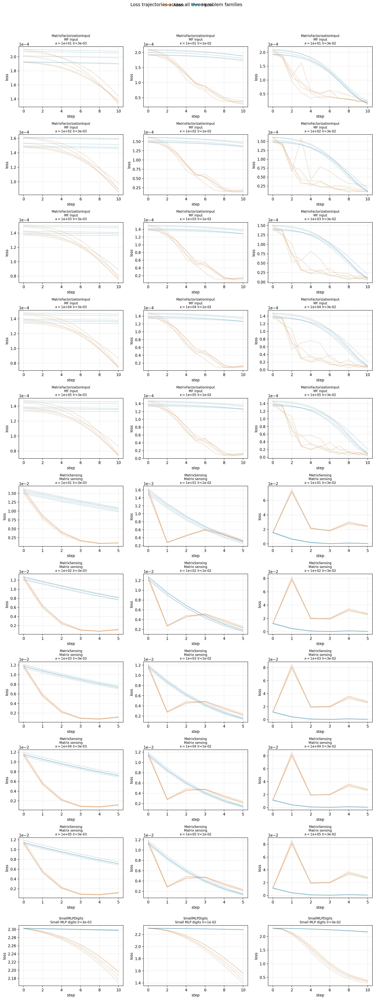

### geometry_separation.png

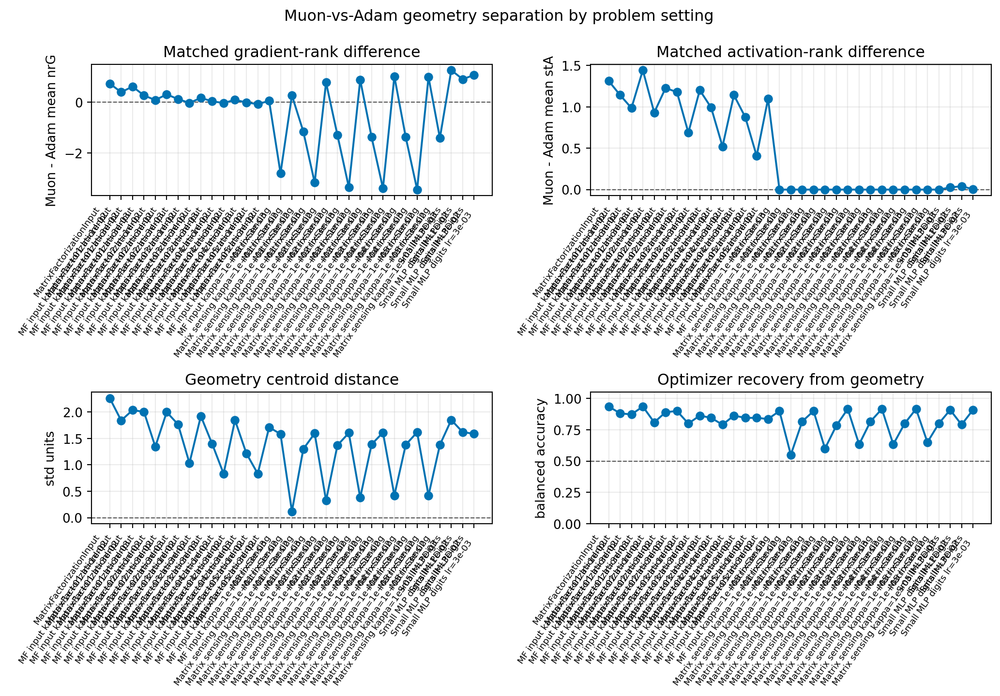

### predicted_decrease_vs_observed.png

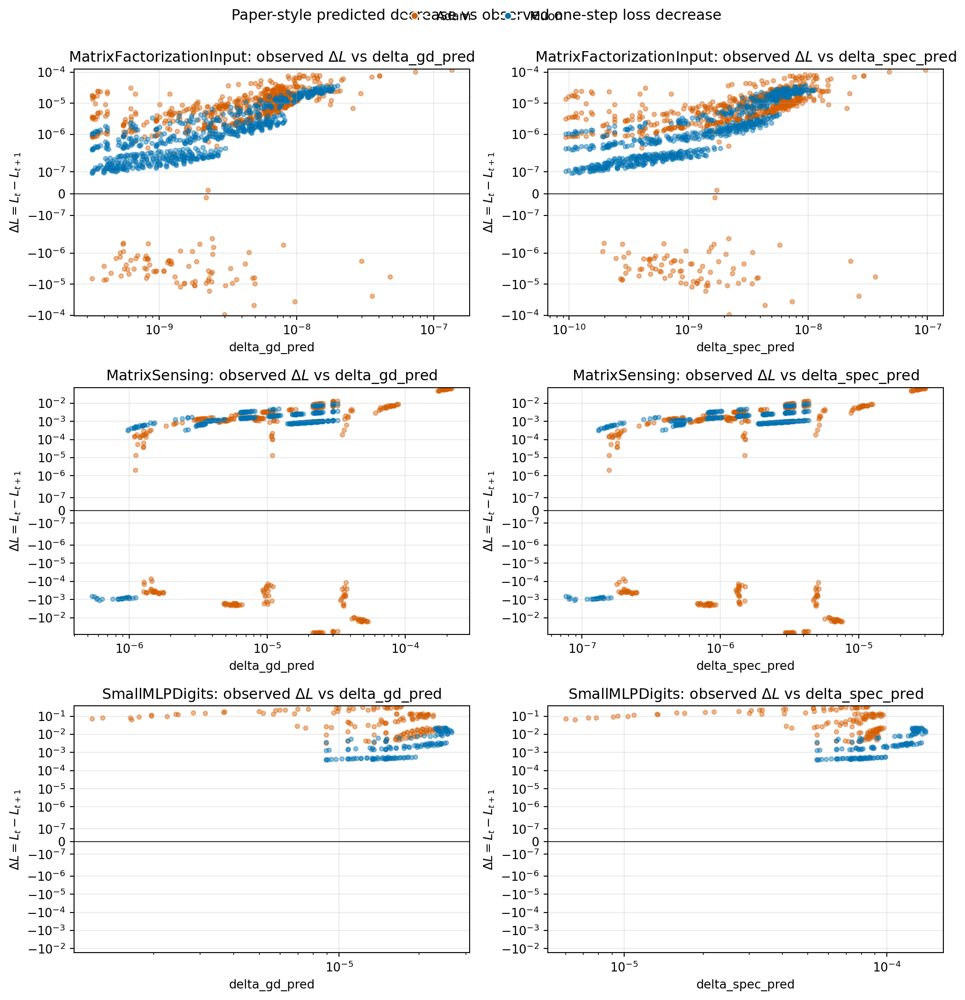

### condition_score_trajectories.png

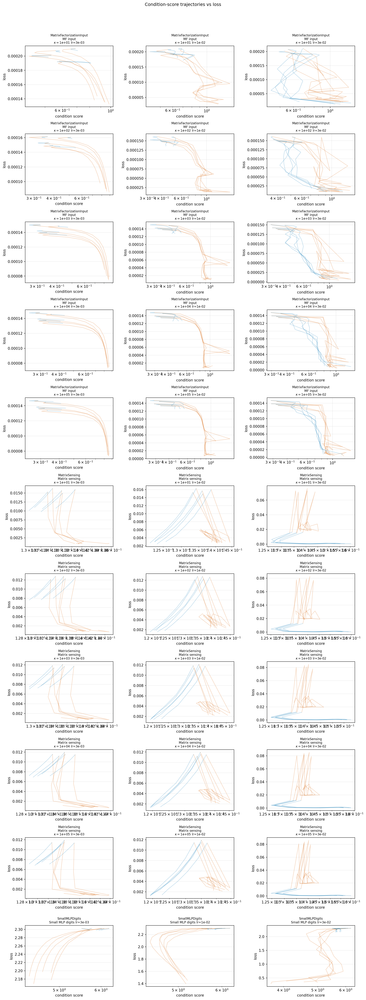

### mean_3d_condition_loss.png

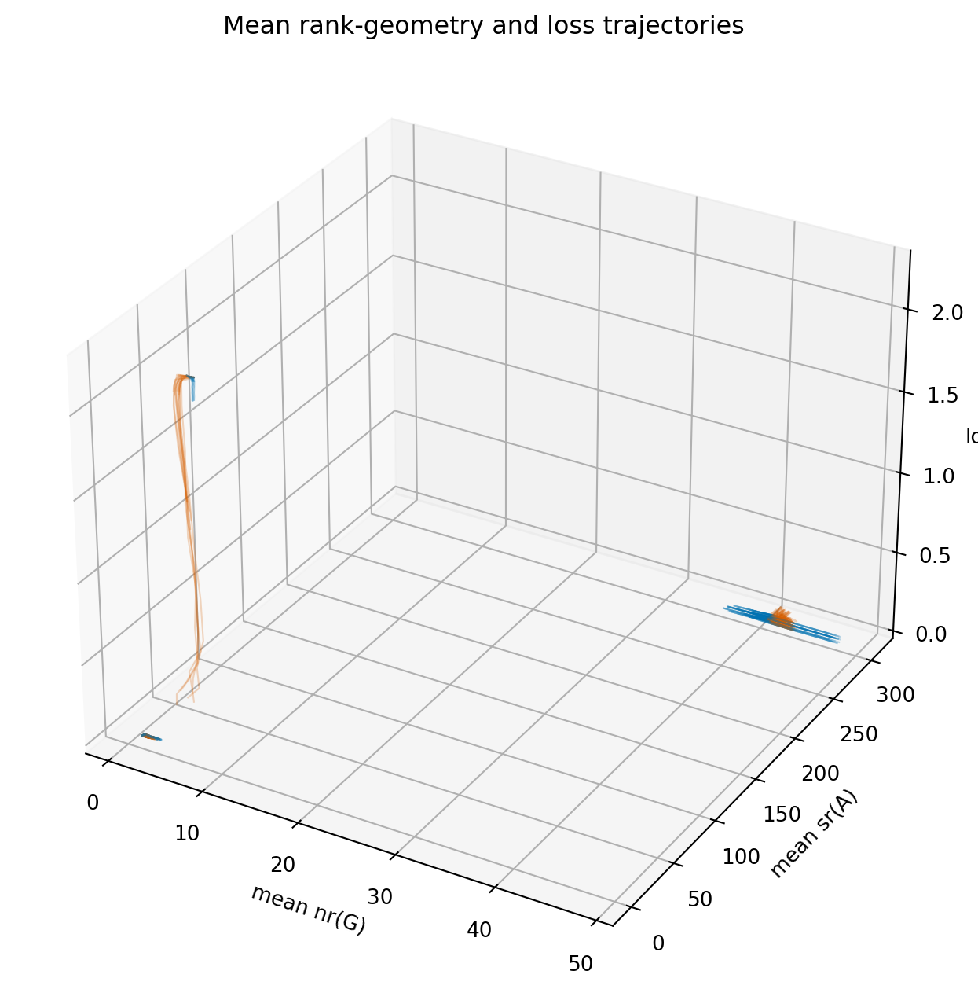

### layerwise_3d_condition_loss.png

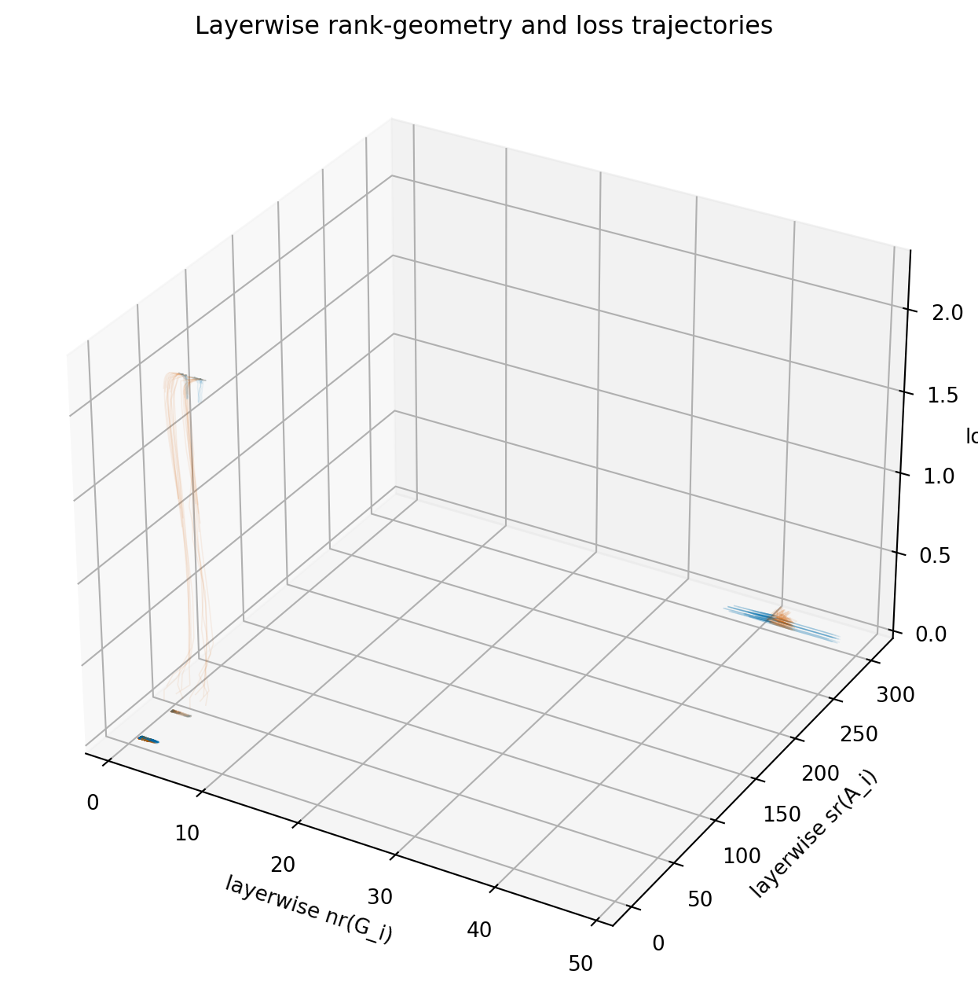

### volatility_robustness.png

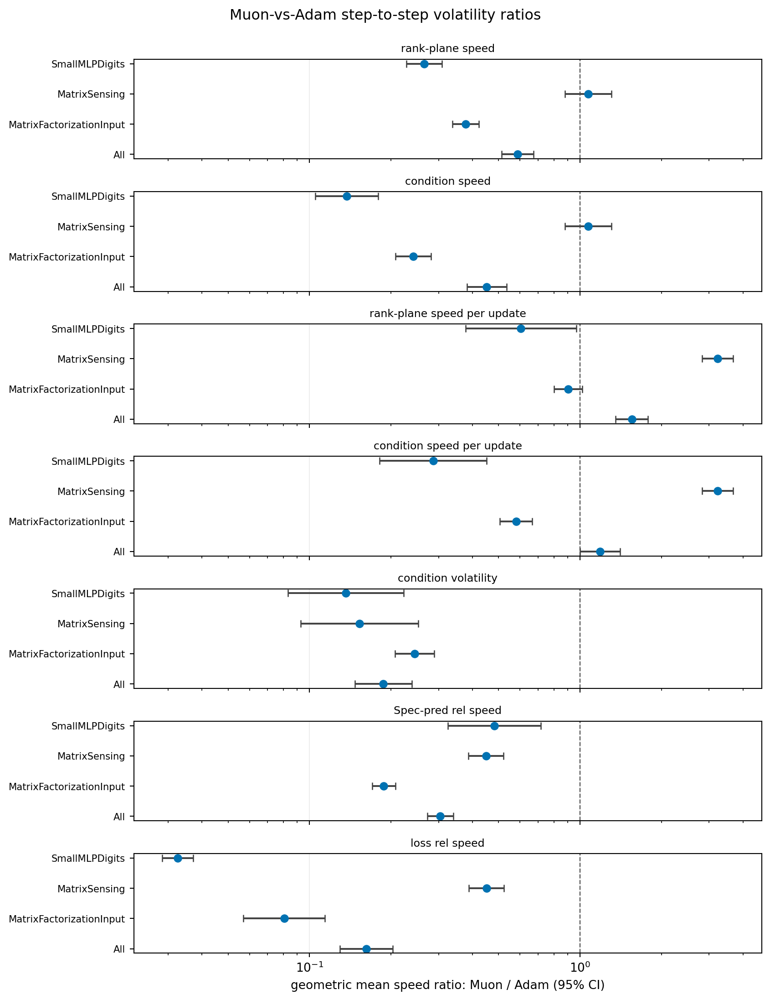

### update_spectrum_robustness.png

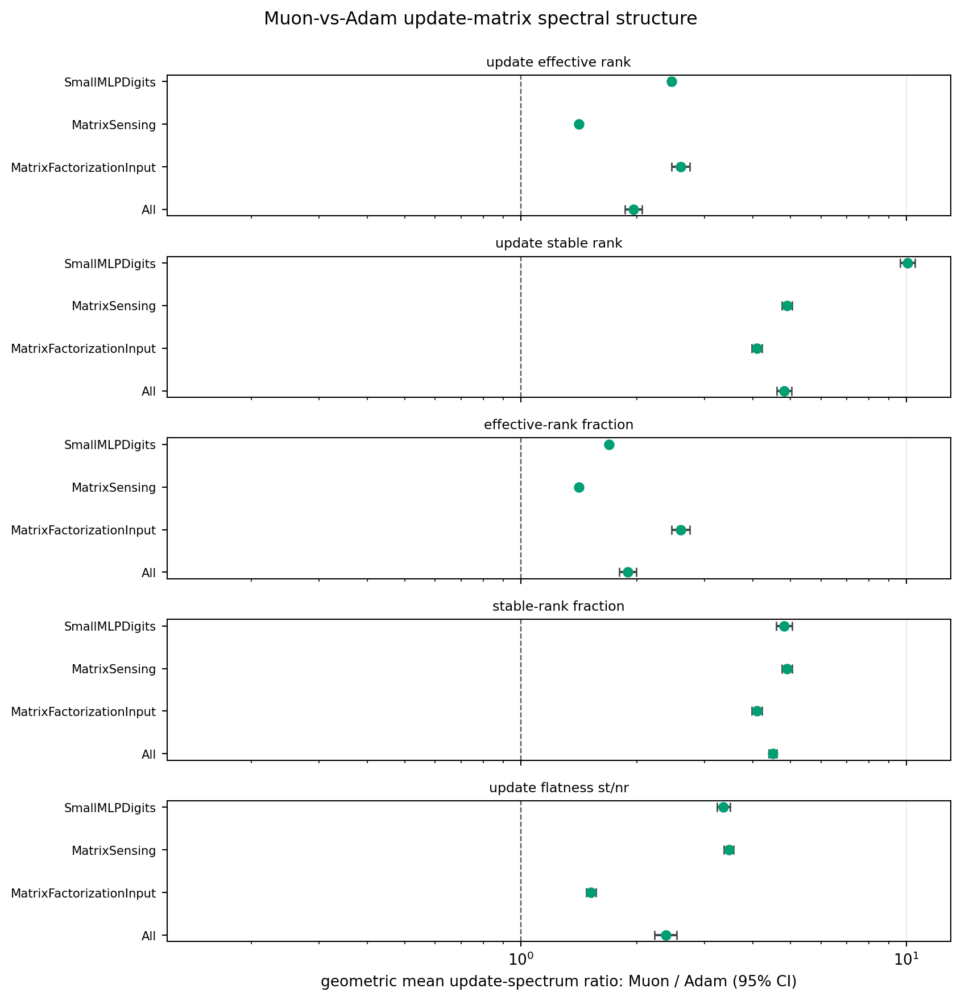

### update_transmission_heatmap.png

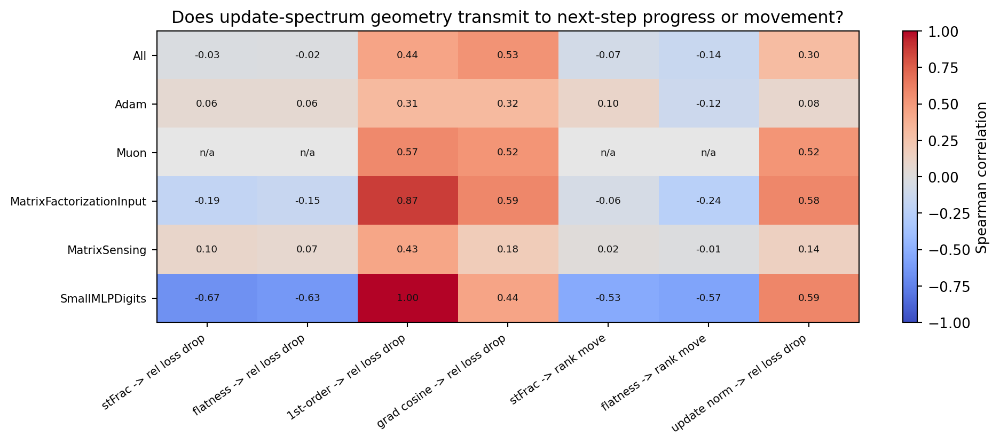

### first_order_calibration.png

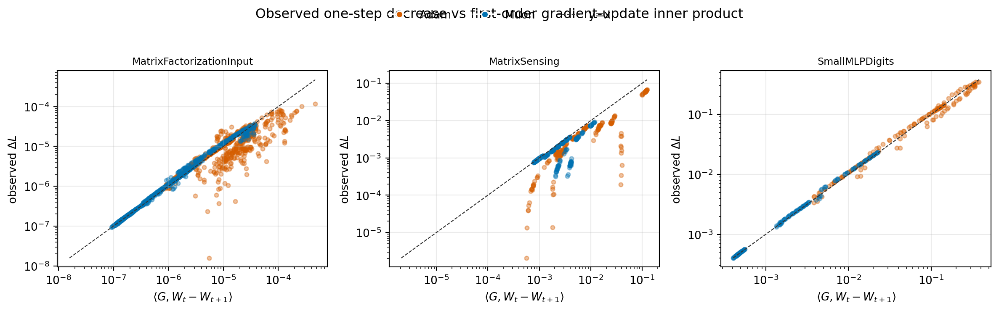

### polar_alignment_identity.png

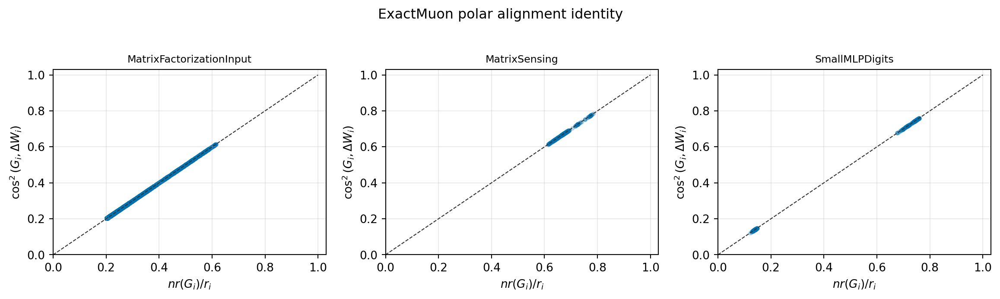

### first_order_pair_comparison.png

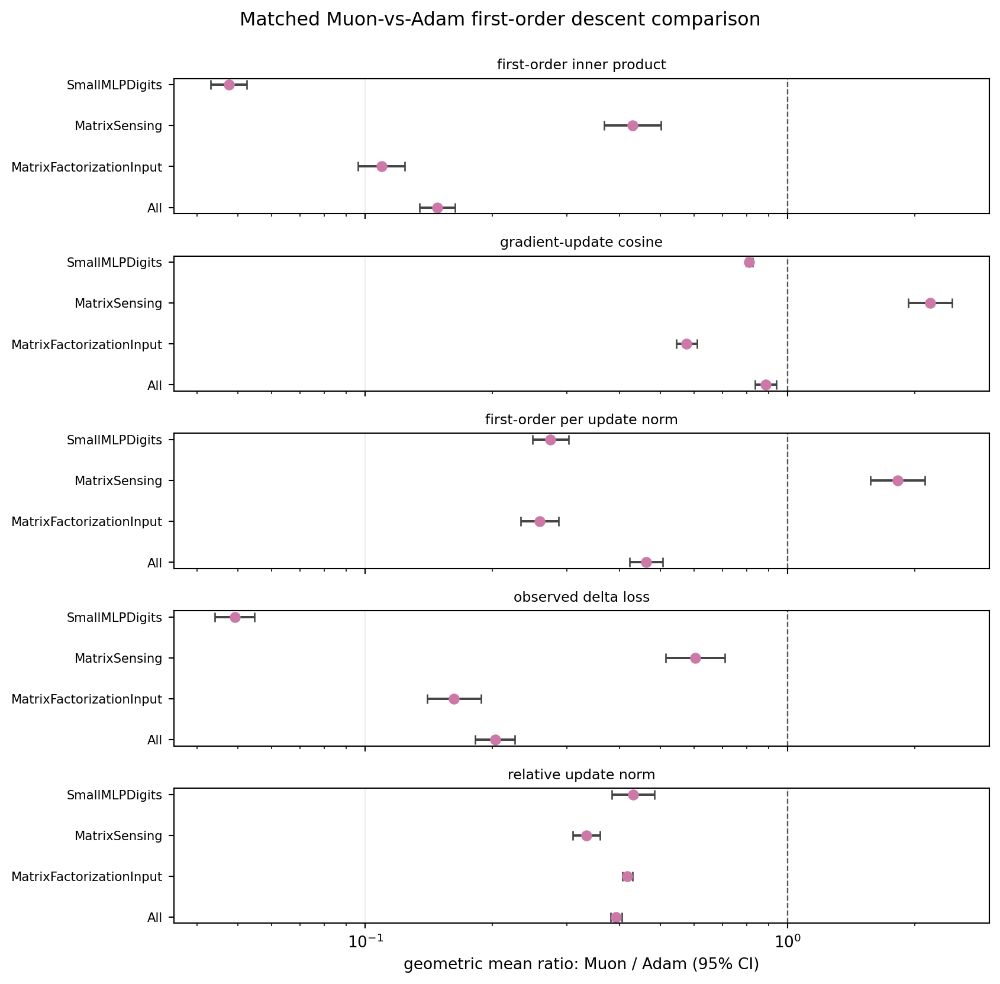

### equal_update_volatility_robustness.png

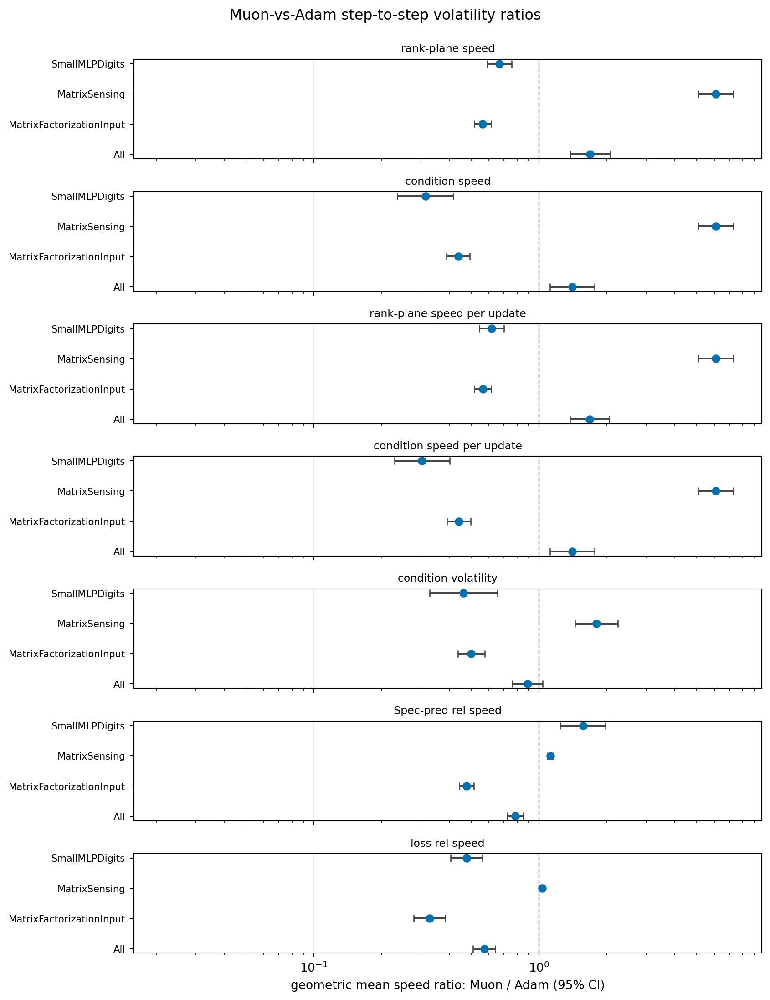

### equal_update_update_spectrum_robustness.png

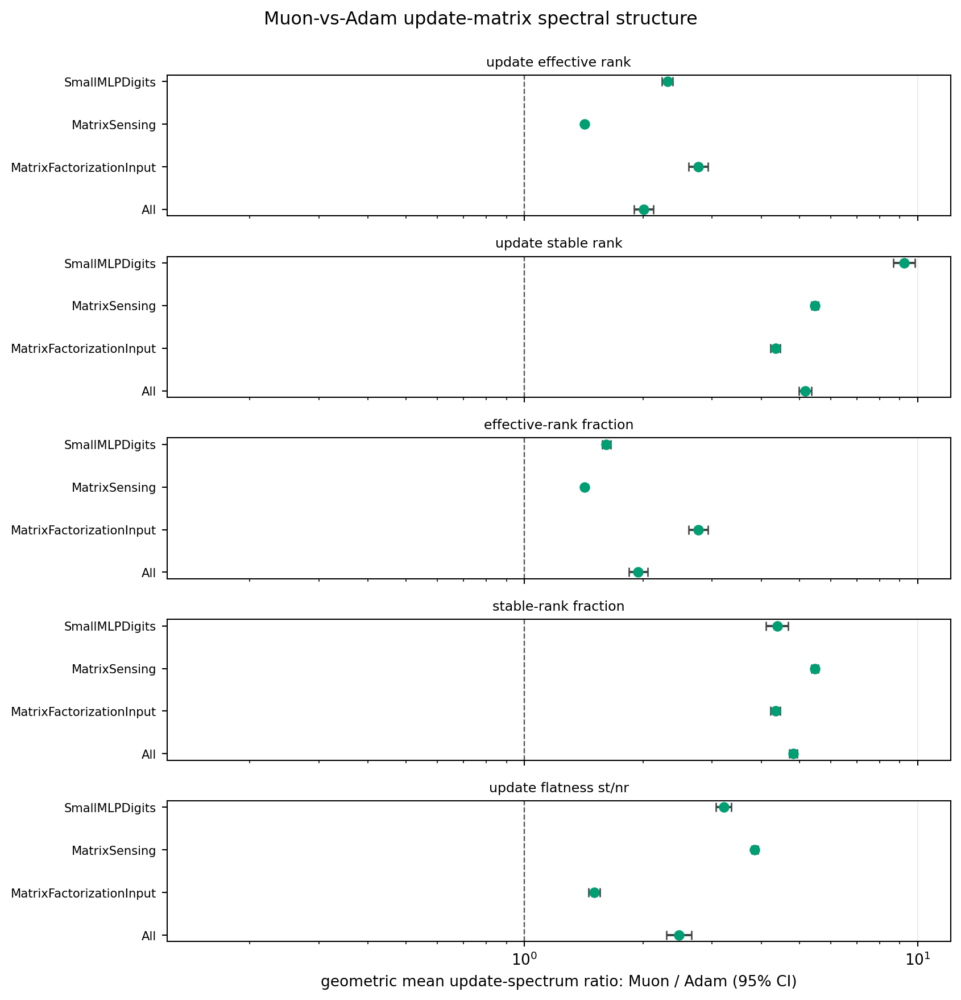

### equal_update_update_transmission_heatmap.png

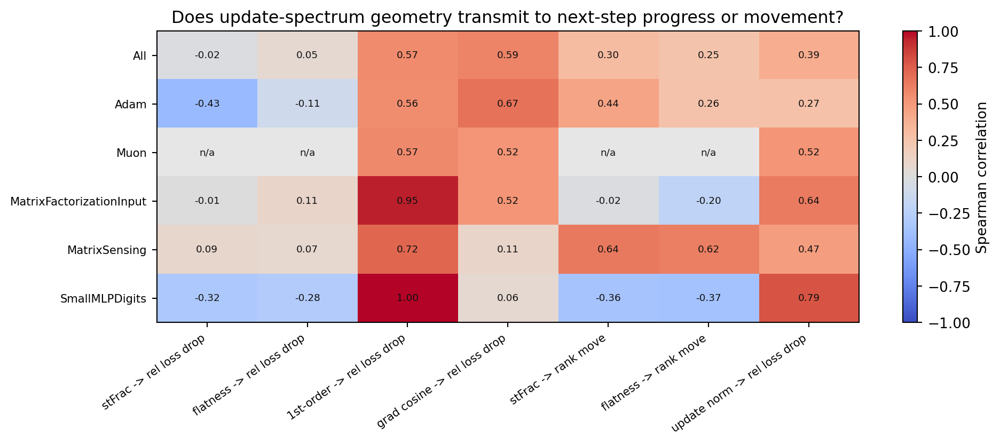

### equal_update_first_order_calibration.png

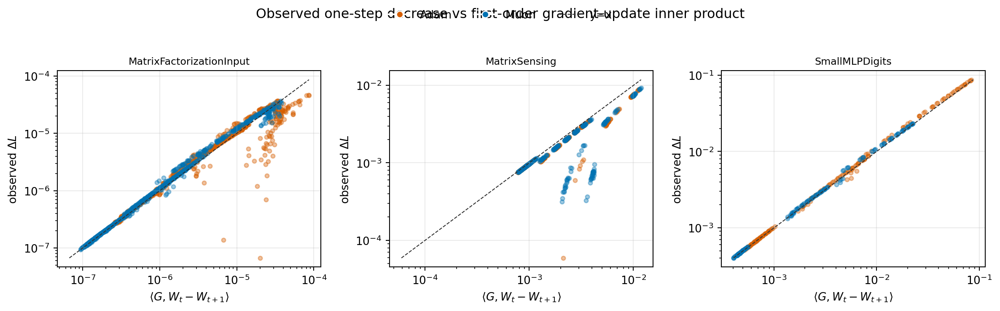

### equal_update_polar_alignment_identity.png

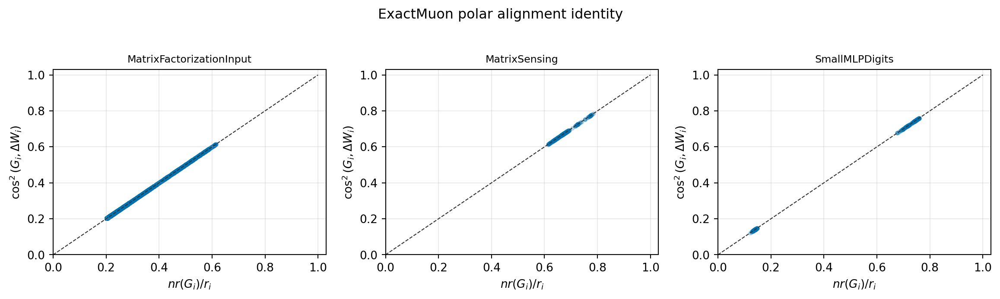

### equal_update_first_order_pair_comparison.png

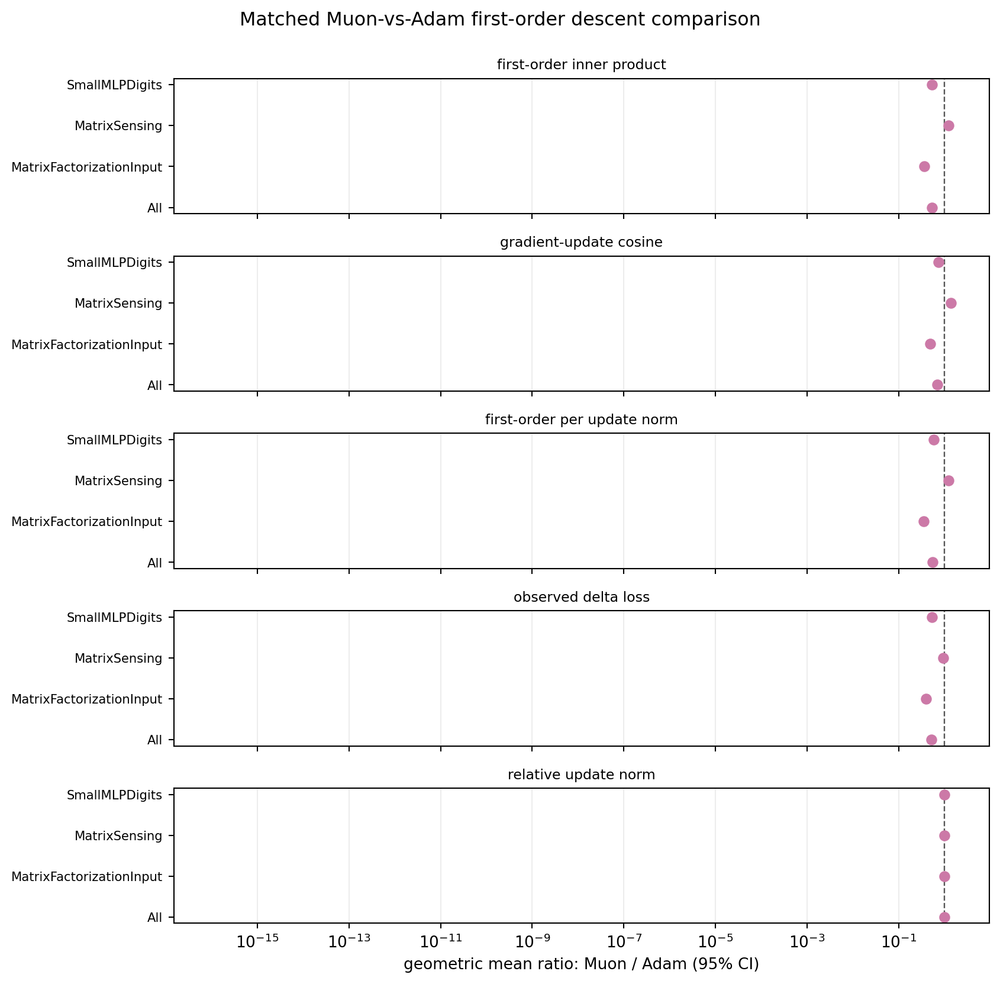

In [3]:
for name in [
    "loss_curves.png",
    "geometry_separation.png",
    "predicted_decrease_vs_observed.png",
    "condition_score_trajectories.png",
    "mean_3d_condition_loss.png",
    "layerwise_3d_condition_loss.png",
    "volatility_robustness.png",
    "update_spectrum_robustness.png",
    "update_transmission_heatmap.png",
    "first_order_calibration.png",
    "polar_alignment_identity.png",
    "first_order_pair_comparison.png",
]:
    display(Markdown(f"### {name}"))
    display(Image(filename=str(FIGURES / name)))

display(Markdown("### equal_update_volatility_robustness.png"))
display(Image(filename=str(EQUAL_FIGURES / "volatility_robustness.png")))
display(Markdown("### equal_update_update_spectrum_robustness.png"))
display(Image(filename=str(EQUAL_FIGURES / "update_spectrum_robustness.png")))
display(Markdown("### equal_update_update_transmission_heatmap.png"))
display(Image(filename=str(EQUAL_FIGURES / "update_transmission_heatmap.png")))
display(Markdown("### equal_update_first_order_calibration.png"))
display(Image(filename=str(EQUAL_FIGURES / "first_order_calibration.png")))
display(Markdown("### equal_update_polar_alignment_identity.png"))
display(Image(filename=str(EQUAL_FIGURES / "polar_alignment_identity.png")))
display(Markdown("### equal_update_first_order_pair_comparison.png"))
display(Image(filename=str(EQUAL_FIGURES / "first_order_pair_comparison.png")))


## Discussion Draft

In [4]:
display(Markdown(DISCUSSION.read_text(encoding="utf-8")))

# result for discussion

## Research Question

Legacy background question: how do Adam and Muon differ in condition-geometry diagnostics? These older optimizer-geometry experiments are background guardrails for the current head-to-tail interference paper, not the main paper claim.

## Experiment Scope

The evidence uses three problem families, treated as parallel experiments rather than primary/auxiliary cases:

1. **MF-with-input:** 10-factor matrix factorization with explicit input matrix, `kappa = 10 ... 1e5`, 5 seeds, 10 steps.
2. **Matrix Sensing:** direct matrix variable, same `kappa` sweep, 5 seeds, 5 steps.
3. **Small torch MLP:** sklearn digits classifier, 5 seeds, 10 steps.

For every trainable matrix or linear layer, \(G_i = \nabla_{W_i}L\). For MF-with-input, \(A_i = W_{i+1}\cdots W_{10}Z\). For Matrix Sensing, `A` is the measurement-operator proxy. For the MLP, `A` is the batch input activation to each linear layer. Therefore MF-with-input is the strict theory-aligned activation-product case; the other two are problem-specific spectral diagnostics.

The rank quantities are:

$$
nr(G_i)=\frac{\|G_i\|_*^2}{\|G_i\|_F^2},\qquad
sr(A_i)=\frac{\|A_i\|_F^2}{\|A_i\|_{op}^2},\qquad
C_i=\frac{nr(G_i)}{sr(A_i)}.
$$

## Finding 1: Geometry Separation

**Finding:** Muon and Adam occupy measurably different rank-geometry regions in `(nrG, stA)`, but the direction and implication differ by problem family.

**Interpretation:** This supports the geometry-shaping claim more directly than an optimization-superiority claim.

**Reasoning:** Geometry-only separation is visible when paired `Muon - Adam` differences and nearest-centroid balanced accuracy stay away from zero/chance, but performance must be checked separately.

![Geometry separation](../figures/e11/geometry_separation.png)

| problem_family | setting | seed_count | mean_delta_nrG | nrG_muon_higher_seed_count | mean_delta_stA | delta_stA_95ci | stA_ci95_excludes_zero | mean_delta_loss | mean_delta_recovery | centroid_distance_std | nearest_centroid_balanced_accuracy |
|---|---|---|---|---|---|---|---|---|---|---|---|
| MatrixFactorizationInput | MF input kappa=1e+01 lr=1e-02 | 5 | 0.7412 | 5 | 1.314 | [1.164, 1.463] | True | 8.288e-05 | 0.26 | 2.261 | 0.9364 |
| MatrixFactorizationInput | MF input kappa=1e+01 lr=3e-02 | 5 | 0.4028 | 5 | 1.143 | [0.9457, 1.34] | True | 5.41e-05 | 0.1994 | 1.84 | 0.8818 |
| MatrixFactorizationInput | MF input kappa=1e+01 lr=3e-03 | 5 | 0.625 | 5 | 0.9859 | [0.7208, 1.251] | True | 2.039e-05 | 0.04884 | 2.035 | 0.8727 |
| MatrixFactorizationInput | MF input kappa=1e+02 lr=1e-02 | 5 | 0.2741 | 5 | 1.444 | [1.175, 1.713] | True | 7.307e-05 | 0.3192 | 2.005 | 0.9364 |
| MatrixFactorizationInput | MF input kappa=1e+02 lr=3e-02 | 5 | 0.0904 | 4 | 0.931 | [0.7845, 1.077] | True | 4.792e-05 | 0.2499 | 1.343 | 0.8091 |
| MatrixFactorizationInput | MF input kappa=1e+02 lr=3e-03 | 5 | 0.3161 | 5 | 1.228 | [0.988, 1.469] | True | 2.054e-05 | 0.06616 | 1.998 | 0.8909 |
| MatrixFactorizationInput | MF input kappa=1e+03 lr=1e-02 | 5 | 0.1268 | 5 | 1.178 | [0.9438, 1.412] | True | 7.077e-05 | 0.3398 | 1.765 | 0.9 |
| MatrixFactorizationInput | MF input kappa=1e+03 lr=3e-02 | 5 | -0.02209 | 2 | 0.6875 | [0.5268, 0.8483] | True | 4.929e-05 | 0.2826 | 1.031 | 0.8 |
| MatrixFactorizationInput | MF input kappa=1e+03 lr=3e-03 | 5 | 0.1756 | 5 | 1.202 | [0.8721, 1.532] | True | 2.063e-05 | 0.07181 | 1.923 | 0.8636 |
| MatrixFactorizationInput | MF input kappa=1e+04 lr=1e-02 | 5 | 0.04002 | 3 | 0.9912 | [0.8265, 1.156] | True | 7.023e-05 | 0.3479 | 1.393 | 0.8455 |
| MatrixFactorizationInput | MF input kappa=1e+04 lr=3e-02 | 5 | -0.02685 | 1 | 0.521 | [0.3686, 0.6733] | True | 4.89e-05 | 0.2892 | 0.8322 | 0.7909 |
| MatrixFactorizationInput | MF input kappa=1e+04 lr=3e-03 | 5 | 0.1007 | 5 | 1.142 | [0.8429, 1.442] | True | 2.057e-05 | 0.07328 | 1.846 | 0.8636 |
| MatrixFactorizationInput | MF input kappa=1e+05 lr=1e-02 | 5 | -0.006562 | 3 | 0.8756 | [0.7455, 1.006] | True | 6.971e-05 | 0.3482 | 1.217 | 0.8455 |
| MatrixFactorizationInput | MF input kappa=1e+05 lr=3e-02 | 5 | -0.06859 | 0 | 0.4062 | [0.2912, 0.5213] | True | 5.012e-05 | 0.2999 | 0.8323 | 0.8455 |
| MatrixFactorizationInput | MF input kappa=1e+05 lr=3e-03 | 5 | 0.05762 | 5 | 1.098 | [0.8651, 1.332] | True | 2.031e-05 | 0.07281 | 1.712 | 0.8364 |
| MatrixSensing | Matrix sensing kappa=1e+01 lr=1e-02 | 5 | -2.808 | 0 | 0 | [0, 0] | False | 0.002265 | -0.02818 | 1.583 | 0.9 |
| MatrixSensing | Matrix sensing kappa=1e+01 lr=3e-02 | 5 | 0.2745 | 3 | 0 | [0, 0] | False | -0.02581 | -0.2761 | 0.1173 | 0.55 |
| MatrixSensing | Matrix sensing kappa=1e+01 lr=3e-03 | 5 | -1.151 | 0 | 0 | [0, 0] | False | 0.007698 | 0.03264 | 1.298 | 0.8167 |
| MatrixSensing | Matrix sensing kappa=1e+02 lr=1e-02 | 5 | -3.18 | 0 | 0 | [0, 0] | False | 0.001125 | -0.03622 | 1.596 | 0.9 |
| MatrixSensing | Matrix sensing kappa=1e+02 lr=3e-02 | 5 | 0.7859 | 5 | 0 | [0, 0] | False | -0.02834 | -0.3522 | 0.3233 | 0.6 |
| MatrixSensing | Matrix sensing kappa=1e+02 lr=3e-03 | 5 | -1.296 | 0 | 0 | [0, 0] | False | 0.006104 | 0.02942 | 1.37 | 0.7833 |
| MatrixSensing | Matrix sensing kappa=1e+03 lr=1e-02 | 5 | -3.359 | 0 | 0 | [0, 0] | False | 0.0008574 | -0.0376 | 1.604 | 0.9167 |
| MatrixSensing | Matrix sensing kappa=1e+03 lr=3e-02 | 5 | 0.8927 | 5 | 0 | [0, 0] | False | -0.02915 | -0.3692 | 0.3777 | 0.6333 |
| MatrixSensing | Matrix sensing kappa=1e+03 lr=3e-03 | 5 | -1.375 | 0 | 0 | [0, 0] | False | 0.005713 | 0.02799 | 1.387 | 0.8167 |
| MatrixSensing | Matrix sensing kappa=1e+04 lr=1e-02 | 5 | -3.402 | 0 | 0 | [0, 0] | False | 0.0007818 | -0.03898 | 1.611 | 0.9167 |
| MatrixSensing | Matrix sensing kappa=1e+04 lr=3e-02 | 5 | 1.031 | 5 | 0 | [0, 0] | False | -0.02934 | -0.3777 | 0.4207 | 0.6333 |
| MatrixSensing | Matrix sensing kappa=1e+04 lr=3e-03 | 5 | -1.377 | 0 | 0 | [0, 0] | False | 0.005591 | 0.02745 | 1.38 | 0.8 |
| MatrixSensing | Matrix sensing kappa=1e+05 lr=1e-02 | 5 | -3.452 | 0 | 0 | [0, 0] | False | 0.0007464 | -0.03875 | 1.617 | 0.9167 |
| MatrixSensing | Matrix sensing kappa=1e+05 lr=3e-02 | 5 | 1 | 5 | 0 | [0, 0] | False | -0.02952 | -0.3811 | 0.4184 | 0.65 |
| MatrixSensing | Matrix sensing kappa=1e+05 lr=3e-03 | 5 | -1.412 | 0 | 0 | [0, 0] | False | 0.005546 | 0.02775 | 1.378 | 0.8 |
| SmallMLPDigits | Small MLP digits lr=1e-02 | 5 | 1.273 | 5 | 0.02559 | [0.007486, 0.0437] | True | 0.2854 | 0.05584 | 1.849 | 0.9091 |
| SmallMLPDigits | Small MLP digits lr=3e-02 | 5 | 0.9167 | 5 | 0.04124 | [0.03261, 0.04988] | True | 0.9476 | 0.02761 | 1.62 | 0.7909 |
| SmallMLPDigits | Small MLP digits lr=3e-03 | 5 | 1.081 | 5 | 0.00444 | [-0.01872, 0.0276] | False | 0.0413 | 0.2596 | 1.587 | 0.9091 |

MatrixFactorizationInput: Muon shows higher matched mean `stA`; `stA` CI excludes zero in 15/15 settings; minimum geometry-only balanced accuracy is 0.791. MatrixSensing: Muon shows a non-uniform coordinate-wise difference; `stA` CI excludes zero in 0/15 settings; minimum geometry-only balanced accuracy is 0.550. SmallMLPDigits: Muon shows higher matched mean `nrG` and higher matched mean `stA`; `stA` CI excludes zero in 2/3 settings; minimum geometry-only balanced accuracy is 0.791.

## Finding 2: One-Step Decrease Prediction

**Finding:** Paper-style predicted decrease quantities are compared against observed \(\Delta L = L_t - L_{t+1}\) in all three problem families.

**Interpretation:** The correlations test trend alignment, not exact equality, because Adam and Muon are not identical to the theoretical GD/Spec updates and `A` has problem-specific definitions outside MF.

**Reasoning:** If a predicted decrease is informative, larger predicted values should rank-order larger observed one-step loss decreases.

![Predicted decrease vs observed](../figures/e11/predicted_decrease_vs_observed.png)

| problem_family | setting | algo | predictor | points | positive_delta_points | spearman_all_delta_loss | pearson_log_positive_delta_loss |
|---|---|---|---|---|---|---|---|
| MatrixFactorizationInput | MF input kappa=1e+01 lr=3e-03 | Adam | delta_gd_pred | 50 | 50 | 0.9691 | 0.9226 |
| MatrixFactorizationInput | MF input kappa=1e+01 lr=3e-03 | Adam | delta_spec_pred | 50 | 50 | 0.9747 | 0.9415 |
| MatrixFactorizationInput | MF input kappa=1e+01 lr=3e-03 | Adam | update_grad_inner | 50 | 50 | 0.999 | 0.9978 |
| MatrixFactorizationInput | MF input kappa=1e+01 lr=3e-03 | Muon | delta_gd_pred | 50 | 50 | 0.8379 | 0.8341 |
| MatrixFactorizationInput | MF input kappa=1e+01 lr=3e-03 | Muon | delta_spec_pred | 50 | 50 | 0.9423 | 0.9449 |
| MatrixFactorizationInput | MF input kappa=1e+01 lr=3e-03 | Muon | update_grad_inner | 50 | 50 | 0.9962 | 0.9984 |
| MatrixFactorizationInput | MF input kappa=1e+01 lr=1e-02 | Adam | delta_gd_pred | 50 | 50 | 0.9012 | 0.7574 |
| MatrixFactorizationInput | MF input kappa=1e+01 lr=1e-02 | Adam | delta_spec_pred | 50 | 50 | 0.9537 | 0.7615 |
| MatrixFactorizationInput | MF input kappa=1e+01 lr=1e-02 | Adam | update_grad_inner | 50 | 50 | 0.8145 | 0.8036 |
| MatrixFactorizationInput | MF input kappa=1e+01 lr=1e-02 | Muon | delta_gd_pred | 50 | 50 | 0.9585 | 0.9543 |
| MatrixFactorizationInput | MF input kappa=1e+01 lr=1e-02 | Muon | delta_spec_pred | 50 | 50 | 0.9857 | 0.9698 |
| MatrixFactorizationInput | MF input kappa=1e+01 lr=1e-02 | Muon | update_grad_inner | 50 | 50 | 0.9981 | 0.9982 |
| MatrixFactorizationInput | MF input kappa=1e+01 lr=3e-02 | Adam | delta_gd_pred | 50 | 44 | 0.5642 | 0.6849 |
| MatrixFactorizationInput | MF input kappa=1e+01 lr=3e-02 | Adam | delta_spec_pred | 50 | 44 | 0.5369 | 0.6484 |
| MatrixFactorizationInput | MF input kappa=1e+01 lr=3e-02 | Adam | update_grad_inner | 50 | 44 | 0.7347 | 0.8593 |
| MatrixFactorizationInput | MF input kappa=1e+01 lr=3e-02 | Muon | delta_gd_pred | 50 | 50 | 0.9799 | 0.983 |
| MatrixFactorizationInput | MF input kappa=1e+01 lr=3e-02 | Muon | delta_spec_pred | 50 | 50 | 0.9128 | 0.9458 |
| MatrixFactorizationInput | MF input kappa=1e+01 lr=3e-02 | Muon | update_grad_inner | 50 | 50 | 0.9309 | 0.9749 |
| MatrixFactorizationInput | MF input kappa=1e+02 lr=3e-03 | Adam | delta_gd_pred | 50 | 50 | 0.9485 | 0.8992 |
| MatrixFactorizationInput | MF input kappa=1e+02 lr=3e-03 | Adam | delta_spec_pred | 50 | 50 | 0.9649 | 0.9407 |
| MatrixFactorizationInput | MF input kappa=1e+02 lr=3e-03 | Adam | update_grad_inner | 50 | 50 | 0.9982 | 0.9973 |
| MatrixFactorizationInput | MF input kappa=1e+02 lr=3e-03 | Muon | delta_gd_pred | 50 | 50 | 0.8642 | 0.8582 |
| MatrixFactorizationInput | MF input kappa=1e+02 lr=3e-03 | Muon | delta_spec_pred | 50 | 50 | 0.9524 | 0.9495 |
| MatrixFactorizationInput | MF input kappa=1e+02 lr=3e-03 | Muon | update_grad_inner | 50 | 50 | 0.9978 | 0.9982 |
| MatrixFactorizationInput | MF input kappa=1e+02 lr=1e-02 | Adam | delta_gd_pred | 50 | 43 | 0.8412 | 0.9021 |
| MatrixFactorizationInput | MF input kappa=1e+02 lr=1e-02 | Adam | delta_spec_pred | 50 | 43 | 0.8977 | 0.9212 |
| MatrixFactorizationInput | MF input kappa=1e+02 lr=1e-02 | Adam | update_grad_inner | 50 | 43 | 0.7911 | 0.7843 |
| MatrixFactorizationInput | MF input kappa=1e+02 lr=1e-02 | Muon | delta_gd_pred | 50 | 50 | 0.9585 | 0.9472 |
| MatrixFactorizationInput | MF input kappa=1e+02 lr=1e-02 | Muon | delta_spec_pred | 50 | 50 | 0.9798 | 0.9676 |
| MatrixFactorizationInput | MF input kappa=1e+02 lr=1e-02 | Muon | update_grad_inner | 50 | 50 | 0.9981 | 0.998 |
| MatrixFactorizationInput | MF input kappa=1e+02 lr=3e-02 | Adam | delta_gd_pred | 50 | 40 | 0.5585 | 0.6052 |
| MatrixFactorizationInput | MF input kappa=1e+02 lr=3e-02 | Adam | delta_spec_pred | 50 | 40 | 0.5548 | 0.5384 |
| MatrixFactorizationInput | MF input kappa=1e+02 lr=3e-02 | Adam | update_grad_inner | 50 | 40 | 0.6731 | 0.806 |
| MatrixFactorizationInput | MF input kappa=1e+02 lr=3e-02 | Muon | delta_gd_pred | 50 | 50 | 0.9857 | 0.98 |
| MatrixFactorizationInput | MF input kappa=1e+02 lr=3e-02 | Muon | delta_spec_pred | 50 | 50 | 0.9567 | 0.9631 |
| MatrixFactorizationInput | MF input kappa=1e+02 lr=3e-02 | Muon | update_grad_inner | 50 | 50 | 0.9393 | 0.9844 |
| MatrixFactorizationInput | MF input kappa=1e+03 lr=3e-03 | Adam | delta_gd_pred | 50 | 50 | 0.9358 | 0.8875 |
| MatrixFactorizationInput | MF input kappa=1e+03 lr=3e-03 | Adam | delta_spec_pred | 50 | 50 | 0.9551 | 0.9357 |
| MatrixFactorizationInput | MF input kappa=1e+03 lr=3e-03 | Adam | update_grad_inner | 50 | 50 | 0.9981 | 0.997 |
| MatrixFactorizationInput | MF input kappa=1e+03 lr=3e-03 | Muon | delta_gd_pred | 50 | 50 | 0.9005 | 0.8821 |
| MatrixFactorizationInput | MF input kappa=1e+03 lr=3e-03 | Muon | delta_spec_pred | 50 | 50 | 0.9518 | 0.9464 |
| MatrixFactorizationInput | MF input kappa=1e+03 lr=3e-03 | Muon | update_grad_inner | 50 | 50 | 0.9959 | 0.9981 |
| MatrixFactorizationInput | MF input kappa=1e+03 lr=1e-02 | Adam | delta_gd_pred | 50 | 43 | 0.8646 | 0.8858 |
| MatrixFactorizationInput | MF input kappa=1e+03 lr=1e-02 | Adam | delta_spec_pred | 50 | 43 | 0.9066 | 0.8875 |
| MatrixFactorizationInput | MF input kappa=1e+03 lr=1e-02 | Adam | update_grad_inner | 50 | 43 | 0.8052 | 0.7554 |
| MatrixFactorizationInput | MF input kappa=1e+03 lr=1e-02 | Muon | delta_gd_pred | 50 | 50 | 0.9667 | 0.9523 |
| MatrixFactorizationInput | MF input kappa=1e+03 lr=1e-02 | Muon | delta_spec_pred | 50 | 50 | 0.9715 | 0.9584 |
| MatrixFactorizationInput | MF input kappa=1e+03 lr=1e-02 | Muon | update_grad_inner | 50 | 50 | 0.9975 | 0.998 |
| MatrixFactorizationInput | MF input kappa=1e+03 lr=3e-02 | Adam | delta_gd_pred | 50 | 37 | 0.5758 | 0.5265 |
| MatrixFactorizationInput | MF input kappa=1e+03 lr=3e-02 | Adam | delta_spec_pred | 50 | 37 | 0.5506 | 0.4495 |
| MatrixFactorizationInput | MF input kappa=1e+03 lr=3e-02 | Adam | update_grad_inner | 50 | 37 | 0.6489 | 0.766 |
| MatrixFactorizationInput | MF input kappa=1e+03 lr=3e-02 | Muon | delta_gd_pred | 50 | 50 | 0.9841 | 0.9766 |
| MatrixFactorizationInput | MF input kappa=1e+03 lr=3e-02 | Muon | delta_spec_pred | 50 | 50 | 0.9705 | 0.9563 |
| MatrixFactorizationInput | MF input kappa=1e+03 lr=3e-02 | Muon | update_grad_inner | 50 | 50 | 0.9656 | 0.9865 |
| MatrixFactorizationInput | MF input kappa=1e+04 lr=3e-03 | Adam | delta_gd_pred | 50 | 50 | 0.9276 | 0.8799 |
| MatrixFactorizationInput | MF input kappa=1e+04 lr=3e-03 | Adam | delta_spec_pred | 50 | 50 | 0.9492 | 0.9327 |
| MatrixFactorizationInput | MF input kappa=1e+04 lr=3e-03 | Adam | update_grad_inner | 50 | 50 | 0.9978 | 0.9969 |
| MatrixFactorizationInput | MF input kappa=1e+04 lr=3e-03 | Muon | delta_gd_pred | 50 | 50 | 0.914 | 0.9077 |
| MatrixFactorizationInput | MF input kappa=1e+04 lr=3e-03 | Muon | delta_spec_pred | 50 | 50 | 0.9453 | 0.9448 |
| MatrixFactorizationInput | MF input kappa=1e+04 lr=3e-03 | Muon | update_grad_inner | 50 | 50 | 0.9946 | 0.9979 |
| MatrixFactorizationInput | MF input kappa=1e+04 lr=1e-02 | Adam | delta_gd_pred | 50 | 43 | 0.8449 | 0.8808 |
| MatrixFactorizationInput | MF input kappa=1e+04 lr=1e-02 | Adam | delta_spec_pred | 50 | 43 | 0.8936 | 0.8787 |
| MatrixFactorizationInput | MF input kappa=1e+04 lr=1e-02 | Adam | update_grad_inner | 50 | 43 | 0.8303 | 0.7574 |
| MatrixFactorizationInput | MF input kappa=1e+04 lr=1e-02 | Muon | delta_gd_pred | 50 | 50 | 0.976 | 0.9568 |
| MatrixFactorizationInput | MF input kappa=1e+04 lr=1e-02 | Muon | delta_spec_pred | 50 | 50 | 0.9685 | 0.9556 |
| MatrixFactorizationInput | MF input kappa=1e+04 lr=1e-02 | Muon | update_grad_inner | 50 | 50 | 0.9975 | 0.9978 |
| MatrixFactorizationInput | MF input kappa=1e+04 lr=3e-02 | Adam | delta_gd_pred | 50 | 37 | 0.5486 | 0.3833 |
| MatrixFactorizationInput | MF input kappa=1e+04 lr=3e-02 | Adam | delta_spec_pred | 50 | 37 | 0.5436 | 0.3131 |
| MatrixFactorizationInput | MF input kappa=1e+04 lr=3e-02 | Adam | update_grad_inner | 50 | 37 | 0.6246 | 0.65 |
| MatrixFactorizationInput | MF input kappa=1e+04 lr=3e-02 | Muon | delta_gd_pred | 50 | 50 | 0.9837 | 0.9715 |
| MatrixFactorizationInput | MF input kappa=1e+04 lr=3e-02 | Muon | delta_spec_pred | 50 | 50 | 0.9779 | 0.957 |
| MatrixFactorizationInput | MF input kappa=1e+04 lr=3e-02 | Muon | update_grad_inner | 50 | 50 | 0.9661 | 0.9876 |
| MatrixFactorizationInput | MF input kappa=1e+05 lr=3e-03 | Adam | delta_gd_pred | 50 | 50 | 0.9243 | 0.8803 |
| MatrixFactorizationInput | MF input kappa=1e+05 lr=3e-03 | Adam | delta_spec_pred | 50 | 50 | 0.9473 | 0.9326 |
| MatrixFactorizationInput | MF input kappa=1e+05 lr=3e-03 | Adam | update_grad_inner | 50 | 50 | 0.9976 | 0.9968 |
| MatrixFactorizationInput | MF input kappa=1e+05 lr=3e-03 | Muon | delta_gd_pred | 50 | 50 | 0.9307 | 0.9242 |
| MatrixFactorizationInput | MF input kappa=1e+05 lr=3e-03 | Muon | delta_spec_pred | 50 | 50 | 0.942 | 0.9432 |
| MatrixFactorizationInput | MF input kappa=1e+05 lr=3e-03 | Muon | update_grad_inner | 50 | 50 | 0.9953 | 0.9978 |
| MatrixFactorizationInput | MF input kappa=1e+05 lr=1e-02 | Adam | delta_gd_pred | 50 | 43 | 0.8561 | 0.8522 |
| MatrixFactorizationInput | MF input kappa=1e+05 lr=1e-02 | Adam | delta_spec_pred | 50 | 43 | 0.9002 | 0.8517 |
| MatrixFactorizationInput | MF input kappa=1e+05 lr=1e-02 | Adam | update_grad_inner | 50 | 43 | 0.8115 | 0.7393 |
| MatrixFactorizationInput | MF input kappa=1e+05 lr=1e-02 | Muon | delta_gd_pred | 50 | 50 | 0.9831 | 0.9606 |
| MatrixFactorizationInput | MF input kappa=1e+05 lr=1e-02 | Muon | delta_spec_pred | 50 | 50 | 0.9698 | 0.9532 |
| MatrixFactorizationInput | MF input kappa=1e+05 lr=1e-02 | Muon | update_grad_inner | 50 | 50 | 0.9979 | 0.9978 |
| MatrixFactorizationInput | MF input kappa=1e+05 lr=3e-02 | Adam | delta_gd_pred | 50 | 36 | 0.5753 | 0.4686 |
| MatrixFactorizationInput | MF input kappa=1e+05 lr=3e-02 | Adam | delta_spec_pred | 50 | 36 | 0.5541 | 0.3888 |
| MatrixFactorizationInput | MF input kappa=1e+05 lr=3e-02 | Adam | update_grad_inner | 50 | 36 | 0.6299 | 0.7258 |
| MatrixFactorizationInput | MF input kappa=1e+05 lr=3e-02 | Muon | delta_gd_pred | 50 | 50 | 0.9819 | 0.9677 |
| MatrixFactorizationInput | MF input kappa=1e+05 lr=3e-02 | Muon | delta_spec_pred | 50 | 50 | 0.974 | 0.953 |
| MatrixFactorizationInput | MF input kappa=1e+05 lr=3e-02 | Muon | update_grad_inner | 50 | 50 | 0.9671 | 0.9878 |
| MatrixSensing | Matrix sensing kappa=1e+01 lr=3e-03 | Adam | delta_gd_pred | 25 | 20 | 0.9923 | 0.992 |
| MatrixSensing | Matrix sensing kappa=1e+01 lr=3e-03 | Adam | delta_spec_pred | 25 | 20 | 0.9915 | 0.9912 |
| MatrixSensing | Matrix sensing kappa=1e+01 lr=3e-03 | Adam | update_grad_inner | 25 | 20 | 0.9992 | 0.9985 |
| MatrixSensing | Matrix sensing kappa=1e+01 lr=3e-03 | Muon | delta_gd_pred | 25 | 25 | 0.9908 | 0.9953 |
| MatrixSensing | Matrix sensing kappa=1e+01 lr=3e-03 | Muon | delta_spec_pred | 25 | 25 | 0.9985 | 0.9999 |
| MatrixSensing | Matrix sensing kappa=1e+01 lr=3e-03 | Muon | update_grad_inner | 25 | 25 | 0.9985 | 1 |
| MatrixSensing | Matrix sensing kappa=1e+01 lr=1e-02 | Adam | delta_gd_pred | 25 | 15 | 0.6223 | 0.8971 |
| MatrixSensing | Matrix sensing kappa=1e+01 lr=1e-02 | Adam | delta_spec_pred | 25 | 15 | 0.6246 | 0.8992 |
| MatrixSensing | Matrix sensing kappa=1e+01 lr=1e-02 | Adam | update_grad_inner | 25 | 15 | 0.5231 | 0.9949 |
| MatrixSensing | Matrix sensing kappa=1e+01 lr=1e-02 | Muon | delta_gd_pred | 25 | 25 | 0.9962 | 0.9997 |
| MatrixSensing | Matrix sensing kappa=1e+01 lr=1e-02 | Muon | delta_spec_pred | 25 | 25 | 0.9992 | 0.9999 |
| MatrixSensing | Matrix sensing kappa=1e+01 lr=1e-02 | Muon | update_grad_inner | 25 | 25 | 1 | 1 |
| MatrixSensing | Matrix sensing kappa=1e+01 lr=3e-02 | Adam | delta_gd_pred | 25 | 15 | 0.8731 | 0.9676 |
| MatrixSensing | Matrix sensing kappa=1e+01 lr=3e-02 | Adam | delta_spec_pred | 25 | 15 | 0.8731 | 0.9646 |
| MatrixSensing | Matrix sensing kappa=1e+01 lr=3e-02 | Adam | update_grad_inner | 25 | 15 | 0.3385 | 0.7595 |
| MatrixSensing | Matrix sensing kappa=1e+01 lr=3e-02 | Muon | delta_gd_pred | 25 | 20 | 0.9108 | 0.9015 |
| MatrixSensing | Matrix sensing kappa=1e+01 lr=3e-02 | Muon | delta_spec_pred | 25 | 20 | 0.8869 | 0.8736 |
| MatrixSensing | Matrix sensing kappa=1e+01 lr=3e-02 | Muon | update_grad_inner | 25 | 20 | 0.8869 | 0.8736 |
| MatrixSensing | Matrix sensing kappa=1e+02 lr=3e-03 | Adam | delta_gd_pred | 25 | 20 | 0.8992 | 0.9639 |
| MatrixSensing | Matrix sensing kappa=1e+02 lr=3e-03 | Adam | delta_spec_pred | 25 | 20 | 0.8977 | 0.9621 |
| MatrixSensing | Matrix sensing kappa=1e+02 lr=3e-03 | Adam | update_grad_inner | 25 | 20 | 0.9977 | 0.9914 |
| MatrixSensing | Matrix sensing kappa=1e+02 lr=3e-03 | Muon | delta_gd_pred | 25 | 25 | 0.9954 | 0.9966 |
| MatrixSensing | Matrix sensing kappa=1e+02 lr=3e-03 | Muon | delta_spec_pred | 25 | 25 | 1 | 0.9999 |
| MatrixSensing | Matrix sensing kappa=1e+02 lr=3e-03 | Muon | update_grad_inner | 25 | 25 | 1 | 1 |
| MatrixSensing | Matrix sensing kappa=1e+02 lr=1e-02 | Adam | delta_gd_pred | 25 | 15 | 0.5423 | 0.9465 |
| MatrixSensing | Matrix sensing kappa=1e+02 lr=1e-02 | Adam | delta_spec_pred | 25 | 15 | 0.5154 | 0.9471 |
| MatrixSensing | Matrix sensing kappa=1e+02 lr=1e-02 | Adam | update_grad_inner | 25 | 15 | 0.5123 | 0.9981 |
| MatrixSensing | Matrix sensing kappa=1e+02 lr=1e-02 | Muon | delta_gd_pred | 25 | 25 | 0.9962 | 0.9997 |
| MatrixSensing | Matrix sensing kappa=1e+02 lr=1e-02 | Muon | delta_spec_pred | 25 | 25 | 0.9992 | 0.9999 |
| MatrixSensing | Matrix sensing kappa=1e+02 lr=1e-02 | Muon | update_grad_inner | 25 | 25 | 0.9992 | 0.9999 |
| MatrixSensing | Matrix sensing kappa=1e+02 lr=3e-02 | Adam | delta_gd_pred | 25 | 13 | 0.8823 | 0.9913 |
| MatrixSensing | Matrix sensing kappa=1e+02 lr=3e-02 | Adam | delta_spec_pred | 25 | 13 | 0.8892 | 0.9913 |
| MatrixSensing | Matrix sensing kappa=1e+02 lr=3e-02 | Adam | update_grad_inner | 25 | 13 | 0.3077 | 0.6337 |
| MatrixSensing | Matrix sensing kappa=1e+02 lr=3e-02 | Muon | delta_gd_pred | 25 | 20 | 0.9615 | 0.9476 |
| MatrixSensing | Matrix sensing kappa=1e+02 lr=3e-02 | Muon | delta_spec_pred | 25 | 20 | 0.9654 | 0.9258 |
| MatrixSensing | Matrix sensing kappa=1e+02 lr=3e-02 | Muon | update_grad_inner | 25 | 20 | 0.9654 | 0.9258 |
| MatrixSensing | Matrix sensing kappa=1e+03 lr=3e-03 | Adam | delta_gd_pred | 25 | 20 | 0.8885 | 0.9348 |
| MatrixSensing | Matrix sensing kappa=1e+03 lr=3e-03 | Adam | delta_spec_pred | 25 | 20 | 0.8877 | 0.9318 |
| MatrixSensing | Matrix sensing kappa=1e+03 lr=3e-03 | Adam | update_grad_inner | 25 | 20 | 0.9969 | 0.9796 |
| MatrixSensing | Matrix sensing kappa=1e+03 lr=3e-03 | Muon | delta_gd_pred | 25 | 25 | 0.9908 | 0.9972 |
| MatrixSensing | Matrix sensing kappa=1e+03 lr=3e-03 | Muon | delta_spec_pred | 25 | 25 | 1 | 1 |
| MatrixSensing | Matrix sensing kappa=1e+03 lr=3e-03 | Muon | update_grad_inner | 25 | 25 | 0.9992 | 1 |
| MatrixSensing | Matrix sensing kappa=1e+03 lr=1e-02 | Adam | delta_gd_pred | 25 | 17 | 0.4646 | 0.4848 |
| MatrixSensing | Matrix sensing kappa=1e+03 lr=1e-02 | Adam | delta_spec_pred | 25 | 17 | 0.4677 | 0.4827 |
| MatrixSensing | Matrix sensing kappa=1e+03 lr=1e-02 | Adam | update_grad_inner | 25 | 17 | 0.5485 | 0.7816 |
| MatrixSensing | Matrix sensing kappa=1e+03 lr=1e-02 | Muon | delta_gd_pred | 25 | 25 | 0.9954 | 0.9998 |
| MatrixSensing | Matrix sensing kappa=1e+03 lr=1e-02 | Muon | delta_spec_pred | 25 | 25 | 0.9992 | 0.9999 |
| MatrixSensing | Matrix sensing kappa=1e+03 lr=1e-02 | Muon | update_grad_inner | 25 | 25 | 0.9992 | 0.9999 |
| MatrixSensing | Matrix sensing kappa=1e+03 lr=3e-02 | Adam | delta_gd_pred | 25 | 11 | 0.8715 | 0.9724 |
| MatrixSensing | Matrix sensing kappa=1e+03 lr=3e-02 | Adam | delta_spec_pred | 25 | 11 | 0.8785 | 0.9722 |
| MatrixSensing | Matrix sensing kappa=1e+03 lr=3e-02 | Adam | update_grad_inner | 25 | 11 | 0.3015 | 0.6259 |
| MatrixSensing | Matrix sensing kappa=1e+03 lr=3e-02 | Muon | delta_gd_pred | 25 | 20 | 0.99 | 0.9547 |
| MatrixSensing | Matrix sensing kappa=1e+03 lr=3e-02 | Muon | delta_spec_pred | 25 | 20 | 0.9892 | 0.9349 |
| MatrixSensing | Matrix sensing kappa=1e+03 lr=3e-02 | Muon | update_grad_inner | 25 | 20 | 0.9885 | 0.9349 |
| MatrixSensing | Matrix sensing kappa=1e+04 lr=3e-03 | Adam | delta_gd_pred | 25 | 20 | 0.8785 | 0.9009 |
| MatrixSensing | Matrix sensing kappa=1e+04 lr=3e-03 | Adam | delta_spec_pred | 25 | 20 | 0.8823 | 0.897 |
| MatrixSensing | Matrix sensing kappa=1e+04 lr=3e-03 | Adam | update_grad_inner | 25 | 20 | 0.9954 | 0.9571 |
| MatrixSensing | Matrix sensing kappa=1e+04 lr=3e-03 | Muon | delta_gd_pred | 25 | 25 | 0.9992 | 0.9975 |
| MatrixSensing | Matrix sensing kappa=1e+04 lr=3e-03 | Muon | delta_spec_pred | 25 | 25 | 0.9992 | 1 |
| MatrixSensing | Matrix sensing kappa=1e+04 lr=3e-03 | Muon | update_grad_inner | 25 | 25 | 0.9992 | 1 |
| MatrixSensing | Matrix sensing kappa=1e+04 lr=1e-02 | Adam | delta_gd_pred | 25 | 17 | 0.4838 | 0.6142 |
| MatrixSensing | Matrix sensing kappa=1e+04 lr=1e-02 | Adam | delta_spec_pred | 25 | 17 | 0.4908 | 0.6108 |
| MatrixSensing | Matrix sensing kappa=1e+04 lr=1e-02 | Adam | update_grad_inner | 25 | 17 | 0.5846 | 0.8839 |
| MatrixSensing | Matrix sensing kappa=1e+04 lr=1e-02 | Muon | delta_gd_pred | 25 | 25 | 0.9985 | 0.9998 |
| MatrixSensing | Matrix sensing kappa=1e+04 lr=1e-02 | Muon | delta_spec_pred | 25 | 25 | 0.9992 | 0.9999 |
| MatrixSensing | Matrix sensing kappa=1e+04 lr=1e-02 | Muon | update_grad_inner | 25 | 25 | 0.9992 | 0.9999 |
| MatrixSensing | Matrix sensing kappa=1e+04 lr=3e-02 | Adam | delta_gd_pred | 25 | 10 | 0.87 | 0.9978 |
| MatrixSensing | Matrix sensing kappa=1e+04 lr=3e-02 | Adam | delta_spec_pred | 25 | 10 | 0.8738 | 0.9977 |
| MatrixSensing | Matrix sensing kappa=1e+04 lr=3e-02 | Adam | update_grad_inner | 25 | 10 | 0.3015 | 0.9994 |
| MatrixSensing | Matrix sensing kappa=1e+04 lr=3e-02 | Muon | delta_gd_pred | 25 | 20 | 0.9869 | 0.9578 |
| MatrixSensing | Matrix sensing kappa=1e+04 lr=3e-02 | Muon | delta_spec_pred | 25 | 20 | 0.9754 | 0.9378 |
| MatrixSensing | Matrix sensing kappa=1e+04 lr=3e-02 | Muon | update_grad_inner | 25 | 20 | 0.9754 | 0.9378 |
| MatrixSensing | Matrix sensing kappa=1e+05 lr=3e-03 | Adam | delta_gd_pred | 25 | 20 | 0.8785 | 0.8507 |
| MatrixSensing | Matrix sensing kappa=1e+05 lr=3e-03 | Adam | delta_spec_pred | 25 | 20 | 0.8854 | 0.8464 |
| MatrixSensing | Matrix sensing kappa=1e+05 lr=3e-03 | Adam | update_grad_inner | 25 | 20 | 0.9969 | 0.9133 |
| MatrixSensing | Matrix sensing kappa=1e+05 lr=3e-03 | Muon | delta_gd_pred | 25 | 25 | 0.9977 | 0.9976 |
| MatrixSensing | Matrix sensing kappa=1e+05 lr=3e-03 | Muon | delta_spec_pred | 25 | 25 | 1 | 1 |
| MatrixSensing | Matrix sensing kappa=1e+05 lr=3e-03 | Muon | update_grad_inner | 25 | 25 | 1 | 1 |
| MatrixSensing | Matrix sensing kappa=1e+05 lr=1e-02 | Adam | delta_gd_pred | 25 | 17 | 0.4908 | 0.6326 |
| MatrixSensing | Matrix sensing kappa=1e+05 lr=1e-02 | Adam | delta_spec_pred | 25 | 17 | 0.4915 | 0.6296 |
| MatrixSensing | Matrix sensing kappa=1e+05 lr=1e-02 | Adam | update_grad_inner | 25 | 17 | 0.56 | 0.8903 |
| MatrixSensing | Matrix sensing kappa=1e+05 lr=1e-02 | Muon | delta_gd_pred | 25 | 25 | 0.9985 | 0.9998 |
| MatrixSensing | Matrix sensing kappa=1e+05 lr=1e-02 | Muon | delta_spec_pred | 25 | 25 | 0.9962 | 0.9999 |
| MatrixSensing | Matrix sensing kappa=1e+05 lr=1e-02 | Muon | update_grad_inner | 25 | 25 | 0.9962 | 0.9999 |
| MatrixSensing | Matrix sensing kappa=1e+05 lr=3e-02 | Adam | delta_gd_pred | 25 | 11 | 0.8738 | 0.9847 |
| MatrixSensing | Matrix sensing kappa=1e+05 lr=3e-02 | Adam | delta_spec_pred | 25 | 11 | 0.8785 | 0.9841 |
| MatrixSensing | Matrix sensing kappa=1e+05 lr=3e-02 | Adam | update_grad_inner | 25 | 11 | 0.3008 | 0.6718 |
| MatrixSensing | Matrix sensing kappa=1e+05 lr=3e-02 | Muon | delta_gd_pred | 25 | 20 | 0.9769 | 0.9565 |
| MatrixSensing | Matrix sensing kappa=1e+05 lr=3e-02 | Muon | delta_spec_pred | 25 | 20 | 0.9731 | 0.9373 |
| MatrixSensing | Matrix sensing kappa=1e+05 lr=3e-02 | Muon | update_grad_inner | 25 | 20 | 0.9731 | 0.9373 |
| SmallMLPDigits | Small MLP digits lr=3e-03 | Adam | delta_gd_pred | 50 | 50 | 0.8883 | 0.859 |
| SmallMLPDigits | Small MLP digits lr=3e-03 | Adam | delta_spec_pred | 50 | 50 | 0.8111 | 0.7561 |
| SmallMLPDigits | Small MLP digits lr=3e-03 | Adam | update_grad_inner | 50 | 50 | 0.9967 | 0.9953 |
| SmallMLPDigits | Small MLP digits lr=3e-03 | Muon | delta_gd_pred | 50 | 50 | 0.7014 | 0.7443 |
| SmallMLPDigits | Small MLP digits lr=3e-03 | Muon | delta_spec_pred | 50 | 50 | 0.7922 | 0.8242 |
| SmallMLPDigits | Small MLP digits lr=3e-03 | Muon | update_grad_inner | 50 | 50 | 0.9941 | 0.9983 |
| SmallMLPDigits | Small MLP digits lr=1e-02 | Adam | delta_gd_pred | 50 | 50 | 0.7032 | 0.7697 |
| SmallMLPDigits | Small MLP digits lr=1e-02 | Adam | delta_spec_pred | 50 | 50 | 0.7506 | 0.6944 |
| SmallMLPDigits | Small MLP digits lr=1e-02 | Adam | update_grad_inner | 50 | 50 | 0.9988 | 0.9885 |
| SmallMLPDigits | Small MLP digits lr=1e-02 | Muon | delta_gd_pred | 50 | 50 | 0.9184 | 0.9001 |
| SmallMLPDigits | Small MLP digits lr=1e-02 | Muon | delta_spec_pred | 50 | 50 | 0.9418 | 0.9361 |
| SmallMLPDigits | Small MLP digits lr=1e-02 | Muon | update_grad_inner | 50 | 50 | 0.9975 | 0.9977 |
| SmallMLPDigits | Small MLP digits lr=3e-02 | Adam | delta_gd_pred | 50 | 50 | 0.6667 | 0.429 |
| SmallMLPDigits | Small MLP digits lr=3e-02 | Adam | delta_spec_pred | 50 | 50 | 0.6057 | 0.4113 |
| SmallMLPDigits | Small MLP digits lr=3e-02 | Adam | update_grad_inner | 50 | 50 | 0.9641 | 0.9766 |
| SmallMLPDigits | Small MLP digits lr=3e-02 | Muon | delta_gd_pred | 50 | 50 | 0.5692 | 0.8168 |
| SmallMLPDigits | Small MLP digits lr=3e-02 | Muon | delta_spec_pred | 50 | 50 | 0.7202 | 0.8557 |
| SmallMLPDigits | Small MLP digits lr=3e-02 | Muon | update_grad_inner | 50 | 50 | 0.9996 | 0.9936 |

## Finding 3: Geometry Volatility

**Finding:** Across the current lr sweep, Muon has lower step-to-step volatility in rank/condition diagnostics than Adam.

**Interpretation:** The raw cross-task optimizer signature is not a single direction such as "higher `nrG`" or "higher `stA`"; it is smoother movement in the diagnostic geometry.

**Reasoning:** The comparison is paired by problem setting, learning rate, and seed. The main statistic is the geometric mean ratio `Muon / Adam`; a 95% confidence interval entirely below 1 means Muon moves less in that diagnostic. The per-update rows divide each step's geometry movement by that same step's relative parameter-update size before averaging within a run.

![Volatility robustness](../figures/e11/volatility_robustness.png)

| metric | problem_family | n_pairs | muon_lower_pairs | geomean_ratio_muon_over_adam | ratio_ci95_low | ratio_ci95_high | ratio_ci95_below_one | mean_delta_muon_minus_adam | delta_ci95_low | delta_ci95_high |
|---|---|---|---|---|---|---|---|---|---|---|
| norm_rank_plane_mean_speed | All | 165 | 138 | 0.5877 | 0.5139 | 0.6721 | True | -0.2493 | -0.3241 | -0.1745 |
| norm_rank_plane_mean_speed | MatrixFactorizationInput | 75 | 75 | 0.3778 | 0.3379 | 0.4224 | True | -0.5118 | -0.5998 | -0.4238 |
| norm_rank_plane_mean_speed | MatrixSensing | 75 | 48 | 1.072 | 0.8785 | 1.307 | False | 0.06947 | -0.02771 | 0.1667 |
| norm_rank_plane_mean_speed | SmallMLPDigits | 15 | 15 | 0.2655 | 0.2279 | 0.3093 | True | -0.531 | -0.6355 | -0.4265 |
| norm_condition_mean_speed | All | 165 | 138 | 0.4522 | 0.3822 | 0.5352 | True | -0.1663 | -0.2252 | -0.1074 |
| norm_condition_mean_speed | MatrixFactorizationInput | 75 | 75 | 0.2421 | 0.2082 | 0.2817 | True | -0.3668 | -0.4141 | -0.3195 |
| norm_condition_mean_speed | MatrixSensing | 75 | 48 | 1.072 | 0.8785 | 1.307 | False | 0.07505 | -0.01899 | 0.1691 |
| norm_condition_mean_speed | SmallMLPDigits | 15 | 15 | 0.1375 | 0.1052 | 0.1797 | True | -0.3704 | -0.4586 | -0.2822 |
| condition_score_std_speed | All | 165 | 139 | 0.1875 | 0.1471 | 0.239 | True | -0.06205 | -0.0757 | -0.04841 |
| condition_score_std_speed | MatrixFactorizationInput | 75 | 74 | 0.2445 | 0.207 | 0.2888 | True | -0.0971 | -0.116 | -0.07819 |
| condition_score_std_speed | MatrixSensing | 75 | 50 | 0.1532 | 0.09293 | 0.2527 | True | -0.0006647 | -0.001449 | 0.0001201 |
| condition_score_std_speed | SmallMLPDigits | 15 | 15 | 0.1362 | 0.08334 | 0.2226 | True | -0.1937 | -0.2476 | -0.1398 |
| delta_gd_pred_mean_rel_speed | All | 165 | 162 | 0.3141 | 0.2865 | 0.3445 | True | -0.9816 | -1.177 | -0.786 |
| delta_gd_pred_mean_rel_speed | MatrixFactorizationInput | 75 | 75 | 0.224 | 0.2081 | 0.2412 | True | -1.694 | -2.055 | -1.332 |
| delta_gd_pred_mean_rel_speed | MatrixSensing | 75 | 72 | 0.4266 | 0.3666 | 0.4964 | True | -0.4392 | -0.5213 | -0.357 |
| delta_gd_pred_mean_rel_speed | SmallMLPDigits | 15 | 15 | 0.3687 | 0.2833 | 0.4799 | True | -0.1334 | -0.1954 | -0.0715 |
| delta_spec_pred_mean_rel_speed | All | 165 | 159 | 0.3044 | 0.2727 | 0.3398 | True | -1.536 | -1.924 | -1.148 |
| delta_spec_pred_mean_rel_speed | MatrixFactorizationInput | 75 | 75 | 0.188 | 0.1703 | 0.2076 | True | -2.931 | -3.666 | -2.197 |
| delta_spec_pred_mean_rel_speed | MatrixSensing | 75 | 71 | 0.4494 | 0.3871 | 0.5218 | True | -0.4264 | -0.5128 | -0.34 |
| delta_spec_pred_mean_rel_speed | SmallMLPDigits | 15 | 13 | 0.4822 | 0.3248 | 0.7158 | True | -0.1079 | -0.1734 | -0.04237 |
| loss_mean_rel_speed | All | 165 | 164 | 0.1623 | 0.1295 | 0.2034 | True | -0.216 | -0.2461 | -0.1859 |
| loss_mean_rel_speed | MatrixFactorizationInput | 75 | 74 | 0.08061 | 0.057 | 0.114 | True | -0.1324 | -0.1529 | -0.1119 |
| loss_mean_rel_speed | MatrixSensing | 75 | 75 | 0.4508 | 0.3881 | 0.5236 | True | -0.329 | -0.381 | -0.2769 |
| loss_mean_rel_speed | SmallMLPDigits | 15 | 15 | 0.03258 | 0.02859 | 0.03712 | True | -0.06921 | -0.1044 | -0.03401 |
| median_relative_update_fro_norm | All | 165 | 162 | 0.4141 | 0.3836 | 0.4471 | True | -0.08824 | -0.1005 | -0.07594 |
| median_relative_update_fro_norm | MatrixFactorizationInput | 75 | 75 | 0.4246 | 0.3917 | 0.4602 | True | -0.01381 | -0.01495 | -0.01267 |
| median_relative_update_fro_norm | MatrixSensing | 75 | 75 | 0.3896 | 0.3401 | 0.4462 | True | -0.1653 | -0.1758 | -0.1549 |
| median_relative_update_fro_norm | SmallMLPDigits | 15 | 12 | 0.4964 | 0.3554 | 0.6935 | True | -0.07498 | -0.1029 | -0.04701 |
| per_update_rank_plane_mean_speed | All | 165 | 50 | 1.553 | 1.354 | 1.782 | False | 0.8467 | -1.198 | 2.891 |
| per_update_rank_plane_mean_speed | MatrixFactorizationInput | 75 | 40 | 0.9038 | 0.8 | 1.021 | False | -0.6606 | -5.13 | 3.809 |
| per_update_rank_plane_mean_speed | MatrixSensing | 75 | 0 | 3.222 | 2.821 | 3.68 | False | 2.668 | 2.439 | 2.897 |
| per_update_rank_plane_mean_speed | SmallMLPDigits | 15 | 10 | 0.6045 | 0.3772 | 0.9688 | True | -0.7223 | -1.664 | 0.2191 |
| per_update_condition_mean_speed | All | 165 | 81 | 1.186 | 0.9992 | 1.408 | False | -2.433 | -3.735 | -1.13 |
| per_update_condition_mean_speed | MatrixFactorizationInput | 75 | 66 | 0.58 | 0.5057 | 0.6652 | True | -7.613 | -9.964 | -5.262 |
| per_update_condition_mean_speed | MatrixSensing | 75 | 0 | 3.222 | 2.821 | 3.68 | False | 2.544 | 2.344 | 2.744 |
| per_update_condition_mean_speed | SmallMLPDigits | 15 | 15 | 0.2867 | 0.1818 | 0.4521 | True | -1.412 | -2.016 | -0.808 |

This result should still be read as a trajectory diagnostic, not a performance claim. The equal-update control below tests whether this volatility gap survives after Adam and Muon are forced to have the same global relative update norm at every matched step.

### Equal-Update Control

**Finding:** After per-step relative update norms are matched, the all-family Muon-vs-Adam rank/condition speed advantage disappears.

**Interpretation:** The strongest current evidence is that Muon changes the realized optimization path partly through update-scale control; a task-independent intrinsic rank-geometry smoothing claim is not yet supported.

**Reasoning:** In the control, Adam and Muon start from the same initialization for each setting/seed. Each step first computes the optimizer's proposed update direction, then rescales both optimizers to the smaller proposed global relative update norm. Therefore `median_relative_update_fro_norm` should have ratio 1, and remaining differences reflect direction/geometry rather than update size.

![Equal-update volatility robustness](../figures/e11_equal_update/volatility_robustness.png)

| metric | problem_family | n_pairs | muon_lower_pairs | geomean_ratio_muon_over_adam | ratio_ci95_low | ratio_ci95_high | ratio_ci95_below_one |
|---|---|---|---|---|---|---|---|
| norm_rank_plane_mean_speed | All | 165 | 89 | 1.687 | 1.379 | 2.064 | False |
| norm_rank_plane_mean_speed | MatrixFactorizationInput | 75 | 74 | 0.5619 | 0.5156 | 0.6124 | True |
| norm_rank_plane_mean_speed | MatrixSensing | 75 | 0 | 6.096 | 5.106 | 7.277 | False |
| norm_rank_plane_mean_speed | SmallMLPDigits | 15 | 15 | 0.6678 | 0.5895 | 0.7565 | True |
| norm_condition_mean_speed | All | 165 | 87 | 1.407 | 1.119 | 1.769 | False |
| norm_condition_mean_speed | MatrixFactorizationInput | 75 | 72 | 0.4386 | 0.3895 | 0.494 | True |
| norm_condition_mean_speed | MatrixSensing | 75 | 0 | 6.096 | 5.106 | 7.277 | False |
| norm_condition_mean_speed | SmallMLPDigits | 15 | 15 | 0.3133 | 0.2356 | 0.4166 | True |
| condition_score_std_speed | All | 165 | 104 | 0.8893 | 0.7614 | 1.039 | False |
| condition_score_std_speed | MatrixFactorizationInput | 75 | 69 | 0.501 | 0.4376 | 0.5736 | True |
| condition_score_std_speed | MatrixSensing | 75 | 21 | 1.799 | 1.443 | 2.243 | False |
| condition_score_std_speed | SmallMLPDigits | 15 | 14 | 0.4626 | 0.3267 | 0.655 | True |
| delta_spec_pred_mean_rel_speed | All | 165 | 81 | 0.7846 | 0.7227 | 0.8518 | True |
| delta_spec_pred_mean_rel_speed | MatrixFactorizationInput | 75 | 75 | 0.4771 | 0.4432 | 0.5136 | True |
| delta_spec_pred_mean_rel_speed | MatrixSensing | 75 | 4 | 1.123 | 1.088 | 1.16 | False |
| delta_spec_pred_mean_rel_speed | SmallMLPDigits | 15 | 2 | 1.569 | 1.244 | 1.978 | False |
| loss_mean_rel_speed | All | 165 | 92 | 0.5711 | 0.5102 | 0.6392 | True |
| loss_mean_rel_speed | MatrixFactorizationInput | 75 | 69 | 0.327 | 0.2783 | 0.3841 | True |
| loss_mean_rel_speed | MatrixSensing | 75 | 8 | 1.034 | 1.018 | 1.05 | False |
| loss_mean_rel_speed | SmallMLPDigits | 15 | 15 | 0.4772 | 0.406 | 0.5608 | True |
| median_relative_update_fro_norm | All | 165 | 68 | 1 | 1 | 1 | False |
| median_relative_update_fro_norm | MatrixFactorizationInput | 75 | 22 | 1 | 1 | 1 | False |
| median_relative_update_fro_norm | MatrixSensing | 75 | 42 | 1 | 1 | 1 | False |
| median_relative_update_fro_norm | SmallMLPDigits | 15 | 4 | 1 | 1 | 1 | False |
| per_update_rank_plane_mean_speed | All | 165 | 88 | 1.677 | 1.37 | 2.053 | False |
| per_update_rank_plane_mean_speed | MatrixFactorizationInput | 75 | 73 | 0.5633 | 0.5164 | 0.6145 | True |
| per_update_rank_plane_mean_speed | MatrixSensing | 75 | 0 | 6.101 | 5.116 | 7.275 | False |
| per_update_rank_plane_mean_speed | SmallMLPDigits | 15 | 15 | 0.6165 | 0.5429 | 0.7 | True |
| per_update_condition_mean_speed | All | 165 | 87 | 1.406 | 1.118 | 1.769 | False |
| per_update_condition_mean_speed | MatrixFactorizationInput | 75 | 72 | 0.4407 | 0.3911 | 0.4967 | True |
| per_update_condition_mean_speed | MatrixSensing | 75 | 0 | 6.101 | 5.116 | 7.275 | False |
| per_update_condition_mean_speed | SmallMLPDigits | 15 | 15 | 0.3027 | 0.2285 | 0.4009 | True |

## Finding 4: Update-Matrix Spectrum

**Finding:** The most optimizer-intrinsic spectral difference is in the update matrices themselves: Muon updates have higher effective rank, higher stable rank, and flatter singular spectra than Adam updates across the current tasks.

**Interpretation:** This is a stronger geometry-shaping statement than the raw trajectory-volatility claim, but it is partly by construction: ExactMuon applies the polar direction \(UV^\top\), whose nonzero singular values are equal.

**Reasoning:** For every non-final step and layer, the code records singular values of \(\Delta W_i\). The summary compares run-mean `nrUpdate`, `stUpdate`, their ceiling-normalized forms `nrUpdateFrac = nrUpdate / min(shape)` and `stUpdateFrac = stUpdate / min(shape)`, and `update_flatness = stUpdate / nrUpdate`. Ratios above 1 mean the Muon update matrix is spectrally more spread or closer to full-rank flatness.

![Update spectrum robustness](../figures/e11/update_spectrum_robustness.png)

| metric | problem_family | n_pairs | muon_higher_pairs | geomean_ratio_muon_over_adam | ratio_ci95_low | ratio_ci95_high | ratio_ci95_above_one | mean_delta_muon_minus_adam | delta_ci95_low | delta_ci95_high |
|---|---|---|---|---|---|---|---|---|---|---|
| nrUpdate | All | 165 | 165 | 1.96 | 1.861 | 2.065 | True | 11.35 | 10.17 | 12.53 |
| nrUpdate | MatrixFactorizationInput | 75 | 75 | 2.597 | 2.462 | 2.741 | True | 3.022 | 2.916 | 3.128 |
| nrUpdate | MatrixSensing | 75 | 75 | 1.414 | 1.411 | 1.416 | True | 17.56 | 17.48 | 17.63 |
| nrUpdate | SmallMLPDigits | 15 | 15 | 2.456 | 2.42 | 2.492 | True | 21.93 | 21.72 | 22.13 |
| stUpdate | All | 165 | 165 | 4.82 | 4.617 | 5.031 | True | 26.4 | 23.17 | 29.62 |
| stUpdate | MatrixFactorizationInput | 75 | 75 | 4.096 | 3.974 | 4.222 | True | 3.769 | 3.731 | 3.806 |
| stUpdate | MatrixSensing | 75 | 75 | 4.894 | 4.748 | 5.045 | True | 47.64 | 47.29 | 47.99 |
| stUpdate | SmallMLPDigits | 15 | 15 | 10.06 | 9.621 | 10.52 | True | 33.31 | 33.16 | 33.46 |
| nrUpdateFrac | All | 165 | 165 | 1.895 | 1.8 | 1.994 | True | 0.4449 | 0.4202 | 0.4697 |
| nrUpdateFrac | MatrixFactorizationInput | 75 | 75 | 2.597 | 2.462 | 2.741 | True | 0.6044 | 0.5832 | 0.6257 |
| nrUpdateFrac | MatrixSensing | 75 | 75 | 1.414 | 1.411 | 1.416 | True | 0.2926 | 0.2914 | 0.2939 |
| nrUpdateFrac | SmallMLPDigits | 15 | 15 | 1.692 | 1.673 | 1.712 | True | 0.409 | 0.4028 | 0.4152 |
| stUpdateFrac | All | 165 | 165 | 4.507 | 4.401 | 4.616 | True | 0.7755 | 0.7702 | 0.7808 |
| stUpdateFrac | MatrixFactorizationInput | 75 | 75 | 4.096 | 3.974 | 4.222 | True | 0.7537 | 0.7463 | 0.7612 |
| stUpdateFrac | MatrixSensing | 75 | 75 | 4.894 | 4.748 | 5.045 | True | 0.794 | 0.7882 | 0.7998 |
| stUpdateFrac | SmallMLPDigits | 15 | 15 | 4.818 | 4.596 | 5.051 | True | 0.7917 | 0.7828 | 0.8007 |
| update_flatness | All | 165 | 165 | 2.375 | 2.224 | 2.536 | True | 0.5392 | 0.5095 | 0.569 |
| update_flatness | MatrixFactorizationInput | 75 | 75 | 1.52 | 1.476 | 1.564 | True | 0.3368 | 0.3181 | 0.3556 |
| update_flatness | MatrixSensing | 75 | 75 | 3.465 | 3.366 | 3.566 | True | 0.7092 | 0.7013 | 0.717 |
| update_flatness | SmallMLPDigits | 15 | 15 | 3.355 | 3.226 | 3.489 | True | 0.7012 | 0.6906 | 0.7119 |

The equal-update control preserves this update-spectrum diagnostic because rescaling an update changes singular values by a scalar but does not change effective rank, stable rank, rank fractions, or flatness. The substantive takeaway is therefore not that the update spectrum is surprising, but that this construction-level update geometry does not automatically imply smoother state trajectories or better short-horizon performance.

![Equal-update update spectrum robustness](../figures/e11_equal_update/update_spectrum_robustness.png)

| metric | problem_family | n_pairs | muon_higher_pairs | geomean_ratio_muon_over_adam | ratio_ci95_low | ratio_ci95_high | ratio_ci95_above_one |
|---|---|---|---|---|---|---|---|
| nrUpdate | All | 165 | 165 | 2.01 | 1.901 | 2.125 | True |
| nrUpdate | MatrixFactorizationInput | 75 | 75 | 2.766 | 2.615 | 2.926 | True |
| nrUpdate | MatrixSensing | 75 | 75 | 1.421 | 1.419 | 1.423 | True |
| nrUpdate | SmallMLPDigits | 15 | 15 | 2.309 | 2.237 | 2.385 | True |
| stUpdate | All | 165 | 165 | 5.165 | 4.979 | 5.358 | True |
| stUpdate | MatrixFactorizationInput | 75 | 75 | 4.344 | 4.223 | 4.468 | True |
| stUpdate | MatrixSensing | 75 | 75 | 5.468 | 5.363 | 5.575 | True |
| stUpdate | SmallMLPDigits | 15 | 15 | 9.236 | 8.671 | 9.838 | True |
| nrUpdateFrac | All | 165 | 165 | 1.946 | 1.84 | 2.057 | True |
| nrUpdateFrac | MatrixFactorizationInput | 75 | 75 | 2.766 | 2.615 | 2.926 | True |
| nrUpdateFrac | MatrixSensing | 75 | 75 | 1.421 | 1.419 | 1.423 | True |
| nrUpdateFrac | SmallMLPDigits | 15 | 15 | 1.614 | 1.576 | 1.654 | True |
| stUpdateFrac | All | 165 | 165 | 4.827 | 4.713 | 4.944 | True |
| stUpdateFrac | MatrixFactorizationInput | 75 | 75 | 4.344 | 4.223 | 4.468 | True |
| stUpdateFrac | MatrixSensing | 75 | 75 | 5.468 | 5.363 | 5.575 | True |
| stUpdateFrac | SmallMLPDigits | 15 | 15 | 4.388 | 4.109 | 4.686 | True |
| update_flatness | All | 165 | 165 | 2.47 | 2.297 | 2.655 | True |
| update_flatness | MatrixFactorizationInput | 75 | 75 | 1.503 | 1.454 | 1.554 | True |
| update_flatness | MatrixSensing | 75 | 75 | 3.85 | 3.777 | 3.924 | True |
| update_flatness | SmallMLPDigits | 15 | 15 | 3.211 | 3.071 | 3.357 | True |

## Finding 5: Transmission From Update Geometry

**Finding:** The full-rank flat update spectrum is easy to detect, but its transmission to next-step loss decrease or state-geometry movement is not uniformly monotone across tasks and optimizers.

**Interpretation:** This narrows the open research question: Muon has a construction-level update geometry, but we still need conditions under which that update geometry becomes useful optimization progress.

**Reasoning:** The transmission table correlates current-step update diagnostics with next-step outcomes: relative loss decrease, normalized rank-plane movement, and normalized condition-score movement. It includes both spectrum-only diagnostics and first-order descent diagnostics such as `update_grad_inner = <G, W_t-W_{t+1}>`. Undefined correlations are expected when a predictor is nearly constant, as with Muon's rank fractions under exact polar updates.

![Update transmission heatmap](../figures/e11/update_transmission_heatmap.png)

| group | predictor | outcome | points | spearman | spearman_ci95_low | spearman_ci95_high | ci95_excludes_zero |
|---|---|---|---|---|---|---|---|
| All | stUpdateFrac | relative_loss_decrease | 2550 | -0.02588 | -0.06465 | 0.01297 | False |
| All | stUpdateFrac | norm_rank_movement | 2550 | -0.07412 | -0.1126 | -0.03539 | True |
| All | stUpdateFrac | norm_condition_movement | 2550 | -0.1939 | -0.231 | -0.1562 | True |
| All | update_flatness | relative_loss_decrease | 2550 | -0.02042 | -0.05921 | 0.01843 | False |
| All | update_flatness | norm_rank_movement | 2550 | -0.143 | -0.1809 | -0.1048 | True |
| All | update_flatness | norm_condition_movement | 2550 | -0.2194 | -0.2561 | -0.1821 | True |
| All | relative_update_fro_norm | relative_loss_decrease | 2550 | 0.3036 | 0.2679 | 0.3384 | True |
| All | relative_update_fro_norm | norm_rank_movement | 2550 | 0.3209 | 0.2856 | 0.3553 | True |
| All | relative_update_fro_norm | norm_condition_movement | 2550 | 0.411 | 0.3782 | 0.4428 | True |
| All | update_grad_inner | relative_loss_decrease | 2550 | 0.4411 | 0.4092 | 0.4718 | True |
| All | update_grad_inner | norm_rank_movement | 2550 | 0.1773 | 0.1394 | 0.2147 | True |
| All | update_grad_inner | norm_condition_movement | 2550 | 0.3138 | 0.2784 | 0.3484 | True |
| All | update_grad_cosine | relative_loss_decrease | 2550 | 0.5312 | 0.5027 | 0.5585 | True |
| All | update_grad_cosine | norm_rank_movement | 2550 | 0.1554 | 0.1173 | 0.1931 | True |
| All | update_grad_cosine | norm_condition_movement | 2550 | 0.4049 | 0.3719 | 0.4369 | True |
| All | update_grad_per_update_norm | relative_loss_decrease | 2550 | 0.4252 | 0.3929 | 0.4565 | True |
| All | update_grad_per_update_norm | norm_rank_movement | 2550 | 0.06251 | 0.02373 | 0.1011 | True |
| All | update_grad_per_update_norm | norm_condition_movement | 2550 | 0.2375 | 0.2005 | 0.2738 | True |
| MatrixFactorizationInput | stUpdateFrac | relative_loss_decrease | 1500 | -0.1858 | -0.2342 | -0.1364 | True |
| MatrixFactorizationInput | stUpdateFrac | norm_rank_movement | 1500 | -0.05787 | -0.1082 | -0.007235 | True |
| MatrixFactorizationInput | stUpdateFrac | norm_condition_movement | 1500 | -0.3607 | -0.404 | -0.3158 | True |
| MatrixFactorizationInput | update_flatness | relative_loss_decrease | 1500 | -0.1536 | -0.2027 | -0.1038 | True |
| MatrixFactorizationInput | update_flatness | norm_rank_movement | 1500 | -0.2406 | -0.2877 | -0.1923 | True |
| MatrixFactorizationInput | update_flatness | norm_condition_movement | 1500 | -0.4201 | -0.461 | -0.3775 | True |
| MatrixFactorizationInput | relative_update_fro_norm | relative_loss_decrease | 1500 | 0.5821 | 0.5476 | 0.6146 | True |
| MatrixFactorizationInput | relative_update_fro_norm | norm_rank_movement | 1500 | 0.4488 | 0.4074 | 0.4884 | True |
| MatrixFactorizationInput | relative_update_fro_norm | norm_condition_movement | 1500 | 0.4794 | 0.4394 | 0.5175 | True |
| MatrixFactorizationInput | update_grad_inner | relative_loss_decrease | 1500 | 0.8696 | 0.8566 | 0.8814 | True |
| MatrixFactorizationInput | update_grad_inner | norm_rank_movement | 1500 | 0.2146 | 0.1657 | 0.2624 | True |
| MatrixFactorizationInput | update_grad_inner | norm_condition_movement | 1500 | 0.4284 | 0.3862 | 0.4689 | True |
| MatrixFactorizationInput | update_grad_cosine | relative_loss_decrease | 1500 | 0.5855 | 0.5512 | 0.6178 | True |
| MatrixFactorizationInput | update_grad_cosine | norm_rank_movement | 1500 | 0.03611 | -0.01457 | 0.08661 | False |
| MatrixFactorizationInput | update_grad_cosine | norm_condition_movement | 1500 | 0.3958 | 0.3522 | 0.4377 | True |
| MatrixFactorizationInput | update_grad_per_update_norm | relative_loss_decrease | 1500 | 0.8372 | 0.8214 | 0.8518 | True |
| MatrixFactorizationInput | update_grad_per_update_norm | norm_rank_movement | 1500 | 0.0008114 | -0.04984 | 0.05146 | False |
| MatrixFactorizationInput | update_grad_per_update_norm | norm_condition_movement | 1500 | 0.3261 | 0.2801 | 0.3706 | True |
| MatrixSensing | stUpdateFrac | relative_loss_decrease | 750 | 0.09687 | 0.02535 | 0.1674 | True |
| MatrixSensing | stUpdateFrac | norm_rank_movement | 750 | 0.01815 | -0.05363 | 0.08974 | False |
| MatrixSensing | stUpdateFrac | norm_condition_movement | 750 | 0.02222 | -0.04956 | 0.09378 | False |
| MatrixSensing | update_flatness | relative_loss_decrease | 750 | 0.07482 | 0.003131 | 0.1457 | True |
| MatrixSensing | update_flatness | norm_rank_movement | 750 | -0.0128 | -0.08443 | 0.05895 | False |
| MatrixSensing | update_flatness | norm_condition_movement | 750 | -0.009345 | -0.081 | 0.0624 | False |
| MatrixSensing | relative_update_fro_norm | relative_loss_decrease | 750 | 0.1448 | 0.07389 | 0.2143 | True |
| MatrixSensing | relative_update_fro_norm | norm_rank_movement | 750 | 0.2841 | 0.2169 | 0.3487 | True |
| MatrixSensing | relative_update_fro_norm | norm_condition_movement | 750 | 0.2956 | 0.2288 | 0.3597 | True |
| MatrixSensing | update_grad_inner | relative_loss_decrease | 750 | 0.4312 | 0.3709 | 0.4878 | True |
| MatrixSensing | update_grad_inner | norm_rank_movement | 750 | 0.1537 | 0.08286 | 0.2229 | True |
| MatrixSensing | update_grad_inner | norm_condition_movement | 750 | 0.1644 | 0.09378 | 0.2333 | True |
| MatrixSensing | update_grad_cosine | relative_loss_decrease | 750 | 0.1809 | 0.1106 | 0.2493 | True |
| MatrixSensing | update_grad_cosine | norm_rank_movement | 750 | 0.1812 | 0.1109 | 0.2496 | True |
| MatrixSensing | update_grad_cosine | norm_condition_movement | 750 | 0.1766 | 0.1062 | 0.2452 | True |
| MatrixSensing | update_grad_per_update_norm | relative_loss_decrease | 750 | 0.2269 | 0.1578 | 0.2938 | True |
| MatrixSensing | update_grad_per_update_norm | norm_rank_movement | 750 | -0.1634 | -0.2324 | -0.0928 | True |
| MatrixSensing | update_grad_per_update_norm | norm_condition_movement | 750 | -0.1648 | -0.2338 | -0.09425 | True |
| SmallMLPDigits | stUpdateFrac | relative_loss_decrease | 300 | -0.6713 | -0.7293 | -0.6037 | True |
| SmallMLPDigits | stUpdateFrac | norm_rank_movement | 300 | -0.5311 | -0.6081 | -0.4442 | True |
| SmallMLPDigits | stUpdateFrac | norm_condition_movement | 300 | -0.5317 | -0.6086 | -0.4448 | True |
| SmallMLPDigits | update_flatness | relative_loss_decrease | 300 | -0.6327 | -0.6963 | -0.5592 | True |
| SmallMLPDigits | update_flatness | norm_rank_movement | 300 | -0.5655 | -0.6382 | -0.4829 | True |
| SmallMLPDigits | update_flatness | norm_condition_movement | 300 | -0.5578 | -0.6315 | -0.4742 | True |
| SmallMLPDigits | relative_update_fro_norm | relative_loss_decrease | 300 | 0.5896 | 0.5101 | 0.6591 | True |
| SmallMLPDigits | relative_update_fro_norm | norm_rank_movement | 300 | 0.5907 | 0.5113 | 0.6601 | True |
| SmallMLPDigits | relative_update_fro_norm | norm_condition_movement | 300 | 0.59 | 0.5106 | 0.6595 | True |
| SmallMLPDigits | update_grad_inner | relative_loss_decrease | 300 | 0.9963 | 0.9954 | 0.9971 | True |
| SmallMLPDigits | update_grad_inner | norm_rank_movement | 300 | 0.4856 | 0.3937 | 0.568 | True |
| SmallMLPDigits | update_grad_inner | norm_condition_movement | 300 | 0.5677 | 0.4853 | 0.64 | True |
| SmallMLPDigits | update_grad_cosine | relative_loss_decrease | 300 | 0.4382 | 0.3415 | 0.5257 | True |
| SmallMLPDigits | update_grad_cosine | norm_rank_movement | 300 | 0.4799 | 0.3874 | 0.5629 | True |
| SmallMLPDigits | update_grad_cosine | norm_condition_movement | 300 | 0.5449 | 0.4597 | 0.6202 | True |
| SmallMLPDigits | update_grad_per_update_norm | relative_loss_decrease | 300 | 0.9162 | 0.8959 | 0.9328 | True |
| SmallMLPDigits | update_grad_per_update_norm | norm_rank_movement | 300 | 0.3156 | 0.2095 | 0.4145 | True |
| SmallMLPDigits | update_grad_per_update_norm | norm_condition_movement | 300 | 0.3989 | 0.2988 | 0.4904 | True |
| Adam | stUpdateFrac | relative_loss_decrease | 1275 | 0.06045 | 0.005519 | 0.115 | True |
| Adam | stUpdateFrac | norm_rank_movement | 1275 | 0.1034 | 0.04868 | 0.1574 | True |
| Adam | stUpdateFrac | norm_condition_movement | 1275 | 0.009703 | -0.04527 | 0.06462 | False |
| Adam | update_flatness | relative_loss_decrease | 1275 | 0.06107 | 0.006137 | 0.1156 | True |
| Adam | update_flatness | norm_rank_movement | 1275 | -0.1203 | -0.1741 | -0.06578 | True |
| Adam | update_flatness | norm_condition_movement | 1275 | -0.07729 | -0.1317 | -0.02244 | True |
| Adam | relative_update_fro_norm | relative_loss_decrease | 1275 | 0.0797 | 0.02486 | 0.1341 | True |
| Adam | relative_update_fro_norm | norm_rank_movement | 1275 | 0.08413 | 0.02931 | 0.1384 | True |
| Adam | relative_update_fro_norm | norm_condition_movement | 1275 | 0.0776 | 0.02275 | 0.132 | True |
| Adam | update_grad_inner | relative_loss_decrease | 1275 | 0.3125 | 0.2621 | 0.3613 | True |
| Adam | update_grad_inner | norm_rank_movement | 1275 | -0.08256 | -0.1369 | -0.02773 | True |
| Adam | update_grad_inner | norm_condition_movement | 1275 | -0.06498 | -0.1195 | -0.01006 | True |
| Adam | update_grad_cosine | relative_loss_decrease | 1275 | 0.3187 | 0.2685 | 0.3672 | True |
| Adam | update_grad_cosine | norm_rank_movement | 1275 | -0.1975 | -0.2497 | -0.1441 | True |
| Adam | update_grad_cosine | norm_condition_movement | 1275 | 0.007527 | -0.04744 | 0.06245 | False |
| Adam | update_grad_per_update_norm | relative_loss_decrease | 1275 | 0.3052 | 0.2545 | 0.3542 | True |
| Adam | update_grad_per_update_norm | norm_rank_movement | 1275 | -0.207 | -0.259 | -0.1538 | True |
| Adam | update_grad_per_update_norm | norm_condition_movement | 1275 | -0.1542 | -0.2074 | -0.1001 | True |
| Muon | stUpdateFrac | relative_loss_decrease | 1275 | n/a | n/a | n/a | False |
| Muon | stUpdateFrac | norm_rank_movement | 1275 | n/a | n/a | n/a | False |
| Muon | stUpdateFrac | norm_condition_movement | 1275 | n/a | n/a | n/a | False |
| Muon | update_flatness | relative_loss_decrease | 1275 | n/a | n/a | n/a | False |
| Muon | update_flatness | norm_rank_movement | 1275 | n/a | n/a | n/a | False |
| Muon | update_flatness | norm_condition_movement | 1275 | n/a | n/a | n/a | False |
| Muon | relative_update_fro_norm | relative_loss_decrease | 1275 | 0.5172 | 0.4758 | 0.5564 | True |
| Muon | relative_update_fro_norm | norm_rank_movement | 1275 | 0.4669 | 0.4228 | 0.5088 | True |
| Muon | relative_update_fro_norm | norm_condition_movement | 1275 | 0.5448 | 0.505 | 0.5824 | True |
| Muon | update_grad_inner | relative_loss_decrease | 1275 | 0.572 | 0.5338 | 0.6078 | True |
| Muon | update_grad_inner | norm_rank_movement | 1275 | 0.3327 | 0.2829 | 0.3807 | True |
| Muon | update_grad_inner | norm_condition_movement | 1275 | 0.474 | 0.4303 | 0.5155 | True |
| Muon | update_grad_cosine | relative_loss_decrease | 1275 | 0.517 | 0.4756 | 0.5562 | True |
| Muon | update_grad_cosine | norm_rank_movement | 1275 | 0.2897 | 0.2386 | 0.3393 | True |
| Muon | update_grad_cosine | norm_condition_movement | 1275 | 0.5221 | 0.4809 | 0.5609 | True |
| Muon | update_grad_per_update_norm | relative_loss_decrease | 1275 | 0.5246 | 0.4836 | 0.5633 | True |
| Muon | update_grad_per_update_norm | norm_rank_movement | 1275 | 0.1525 | 0.09838 | 0.2057 | True |
| Muon | update_grad_per_update_norm | norm_condition_movement | 1275 | 0.3749 | 0.3267 | 0.4212 | True |

In the current results, Muon's update-spectrum fractions and flatness are effectively constant within the optimizer, so they cannot explain within-Muon variation in progress. Relative update norm and the first-order gradient-update inner product are the more directly predictive step-level quantities. The same diagnostic under equal-update control checks whether these relations survive after update scale is matched.

![Equal-update transmission heatmap](../figures/e11_equal_update/update_transmission_heatmap.png)

| group | predictor | outcome | points | spearman | spearman_ci95_low | spearman_ci95_high | ci95_excludes_zero |
|---|---|---|---|---|---|---|---|
| All | stUpdateFrac | relative_loss_decrease | 2550 | -0.01963 | -0.05842 | 0.01922 | False |
| All | stUpdateFrac | norm_rank_movement | 2550 | 0.3034 | 0.2677 | 0.3382 | True |
| All | stUpdateFrac | norm_condition_movement | 2550 | 0.1321 | 0.09375 | 0.1701 | True |
| All | update_flatness | relative_loss_decrease | 2550 | 0.05481 | 0.01601 | 0.09345 | True |
| All | update_flatness | norm_rank_movement | 2550 | 0.2517 | 0.215 | 0.2877 | True |
| All | update_flatness | norm_condition_movement | 2550 | 0.1473 | 0.1091 | 0.1851 | True |
| All | relative_update_fro_norm | relative_loss_decrease | 2550 | 0.3916 | 0.3583 | 0.424 | True |
| All | relative_update_fro_norm | norm_rank_movement | 2550 | 0.08418 | 0.04549 | 0.1226 | True |
| All | relative_update_fro_norm | norm_condition_movement | 2550 | 0.129 | 0.09062 | 0.167 | True |
| All | update_grad_inner | relative_loss_decrease | 2550 | 0.5665 | 0.5395 | 0.5923 | True |
| All | update_grad_inner | norm_rank_movement | 2550 | -0.003481 | -0.04231 | 0.03536 | False |
| All | update_grad_inner | norm_condition_movement | 2550 | 0.09617 | 0.05755 | 0.1345 | True |
| All | update_grad_cosine | relative_loss_decrease | 2550 | 0.5946 | 0.5689 | 0.6191 | True |
| All | update_grad_cosine | norm_rank_movement | 2550 | 0.07193 | 0.03319 | 0.1105 | True |
| All | update_grad_cosine | norm_condition_movement | 2550 | 0.3082 | 0.2726 | 0.3429 | True |
| All | update_grad_per_update_norm | relative_loss_decrease | 2550 | 0.5178 | 0.4888 | 0.5456 | True |
| All | update_grad_per_update_norm | norm_rank_movement | 2550 | -0.1016 | -0.1398 | -0.06297 | True |
| All | update_grad_per_update_norm | norm_condition_movement | 2550 | 0.04463 | 0.005804 | 0.08332 | True |
| MatrixFactorizationInput | stUpdateFrac | relative_loss_decrease | 1500 | -0.005345 | -0.05598 | 0.04532 | False |
| MatrixFactorizationInput | stUpdateFrac | norm_rank_movement | 1500 | -0.01918 | -0.06976 | 0.03151 | False |
| MatrixFactorizationInput | stUpdateFrac | norm_condition_movement | 1500 | -0.3233 | -0.3679 | -0.2772 | True |
| MatrixFactorizationInput | update_flatness | relative_loss_decrease | 1500 | 0.1057 | 0.05532 | 0.1555 | True |
| MatrixFactorizationInput | update_flatness | norm_rank_movement | 1500 | -0.2048 | -0.2529 | -0.1558 | True |
| MatrixFactorizationInput | update_flatness | norm_condition_movement | 1500 | -0.3325 | -0.3768 | -0.2867 | True |
| MatrixFactorizationInput | relative_update_fro_norm | relative_loss_decrease | 1500 | 0.6402 | 0.6093 | 0.6691 | True |
| MatrixFactorizationInput | relative_update_fro_norm | norm_rank_movement | 1500 | 0.2406 | 0.1923 | 0.2877 | True |
| MatrixFactorizationInput | relative_update_fro_norm | norm_condition_movement | 1500 | 0.1869 | 0.1376 | 0.2353 | True |
| MatrixFactorizationInput | update_grad_inner | relative_loss_decrease | 1500 | 0.9469 | 0.9414 | 0.9519 | True |
| MatrixFactorizationInput | update_grad_inner | norm_rank_movement | 1500 | 0.0003559 | -0.0503 | 0.05101 | False |
| MatrixFactorizationInput | update_grad_inner | norm_condition_movement | 1500 | 0.1874 | 0.1381 | 0.2359 | True |
| MatrixFactorizationInput | update_grad_cosine | relative_loss_decrease | 1500 | 0.52 | 0.482 | 0.556 | True |
| MatrixFactorizationInput | update_grad_cosine | norm_rank_movement | 1500 | -0.003046 | -0.05369 | 0.04762 | False |
| MatrixFactorizationInput | update_grad_cosine | norm_condition_movement | 1500 | 0.3534 | 0.3083 | 0.397 | True |
| MatrixFactorizationInput | update_grad_per_update_norm | relative_loss_decrease | 1500 | 0.8435 | 0.8282 | 0.8575 | True |
| MatrixFactorizationInput | update_grad_per_update_norm | norm_rank_movement | 1500 | -0.1097 | -0.1594 | -0.05935 | True |
| MatrixFactorizationInput | update_grad_per_update_norm | norm_condition_movement | 1500 | 0.2165 | 0.1677 | 0.2643 | True |
| MatrixSensing | stUpdateFrac | relative_loss_decrease | 750 | 0.08726 | 0.01565 | 0.158 | True |
| MatrixSensing | stUpdateFrac | norm_rank_movement | 750 | 0.641 | 0.5967 | 0.6814 | True |
| MatrixSensing | stUpdateFrac | norm_condition_movement | 750 | 0.6284 | 0.583 | 0.6699 | True |
| MatrixSensing | update_flatness | relative_loss_decrease | 750 | 0.07157 | -0.0001337 | 0.1425 | False |
| MatrixSensing | update_flatness | norm_rank_movement | 750 | 0.6221 | 0.576 | 0.6641 | True |
| MatrixSensing | update_flatness | norm_condition_movement | 750 | 0.6108 | 0.5638 | 0.6538 | True |
| MatrixSensing | relative_update_fro_norm | relative_loss_decrease | 750 | 0.4722 | 0.4145 | 0.5261 | True |
| MatrixSensing | relative_update_fro_norm | norm_rank_movement | 750 | 0.3109 | 0.2446 | 0.3743 | True |
| MatrixSensing | relative_update_fro_norm | norm_condition_movement | 750 | 0.3852 | 0.3224 | 0.4446 | True |
| MatrixSensing | update_grad_inner | relative_loss_decrease | 750 | 0.7215 | 0.6852 | 0.7542 | True |
| MatrixSensing | update_grad_inner | norm_rank_movement | 750 | 0.2592 | 0.1911 | 0.3249 | True |
| MatrixSensing | update_grad_inner | norm_condition_movement | 750 | 0.3262 | 0.2606 | 0.3888 | True |
| MatrixSensing | update_grad_cosine | relative_loss_decrease | 750 | 0.1067 | 0.03531 | 0.1771 | True |
| MatrixSensing | update_grad_cosine | norm_rank_movement | 750 | 0.543 | 0.4904 | 0.5917 | True |
| MatrixSensing | update_grad_cosine | norm_condition_movement | 750 | 0.5027 | 0.4471 | 0.5544 | True |
| MatrixSensing | update_grad_per_update_norm | relative_loss_decrease | 750 | -0.07113 | -0.1421 | 0.0005763 | False |
| MatrixSensing | update_grad_per_update_norm | norm_rank_movement | 750 | -0.168 | -0.2369 | -0.09748 | True |
| MatrixSensing | update_grad_per_update_norm | norm_condition_movement | 750 | -0.2166 | -0.2839 | -0.1472 | True |
| SmallMLPDigits | stUpdateFrac | relative_loss_decrease | 300 | -0.3201 | -0.4186 | -0.2142 | True |
| SmallMLPDigits | stUpdateFrac | norm_rank_movement | 300 | -0.3557 | -0.4511 | -0.2522 | True |
| SmallMLPDigits | stUpdateFrac | norm_condition_movement | 300 | -0.5013 | -0.5819 | -0.4111 | True |
| SmallMLPDigits | update_flatness | relative_loss_decrease | 300 | -0.2836 | -0.3849 | -0.1755 | True |
| SmallMLPDigits | update_flatness | norm_rank_movement | 300 | -0.3664 | -0.4609 | -0.2637 | True |
| SmallMLPDigits | update_flatness | norm_condition_movement | 300 | -0.4931 | -0.5745 | -0.4019 | True |
| SmallMLPDigits | relative_update_fro_norm | relative_loss_decrease | 300 | 0.7909 | 0.7441 | 0.8299 | True |
| SmallMLPDigits | relative_update_fro_norm | norm_rank_movement | 300 | 0.218 | 0.1069 | 0.3237 | True |
| SmallMLPDigits | relative_update_fro_norm | norm_condition_movement | 300 | 0.09425 | -0.01966 | 0.2057 | False |
| SmallMLPDigits | update_grad_inner | relative_loss_decrease | 300 | 0.9995 | 0.9994 | 0.9996 | True |
| SmallMLPDigits | update_grad_inner | norm_rank_movement | 300 | 0.06656 | -0.0475 | 0.1789 | False |
| SmallMLPDigits | update_grad_inner | norm_condition_movement | 300 | 0.03378 | -0.08023 | 0.1469 | False |
| SmallMLPDigits | update_grad_cosine | relative_loss_decrease | 300 | 0.0614 | -0.05267 | 0.1739 | False |
| SmallMLPDigits | update_grad_cosine | norm_rank_movement | 300 | 0.2771 | 0.1687 | 0.3789 | True |
| SmallMLPDigits | update_grad_cosine | norm_condition_movement | 300 | 0.5362 | 0.4499 | 0.6125 | True |
| SmallMLPDigits | update_grad_per_update_norm | relative_loss_decrease | 300 | 0.8423 | 0.8058 | 0.8725 | True |
| SmallMLPDigits | update_grad_per_update_norm | norm_rank_movement | 300 | -0.0927 | -0.2042 | 0.02123 | False |
| SmallMLPDigits | update_grad_per_update_norm | norm_condition_movement | 300 | 0.02119 | -0.09273 | 0.1346 | False |
| Adam | stUpdateFrac | relative_loss_decrease | 1275 | -0.4285 | -0.4723 | -0.3826 | True |
| Adam | stUpdateFrac | norm_rank_movement | 1275 | 0.4414 | 0.396 | 0.4846 | True |
| Adam | stUpdateFrac | norm_condition_movement | 1275 | 0.2957 | 0.2447 | 0.345 | True |
| Adam | update_flatness | relative_loss_decrease | 1275 | -0.1068 | -0.1608 | -0.05213 | True |
| Adam | update_flatness | norm_rank_movement | 1275 | 0.2635 | 0.2116 | 0.3139 | True |
| Adam | update_flatness | norm_condition_movement | 1275 | 0.3828 | 0.3349 | 0.4288 | True |
| Adam | relative_update_fro_norm | relative_loss_decrease | 1275 | 0.272 | 0.2203 | 0.3221 | True |
| Adam | relative_update_fro_norm | norm_rank_movement | 1275 | -0.2739 | -0.324 | -0.2223 | True |
| Adam | relative_update_fro_norm | norm_condition_movement | 1275 | -0.239 | -0.2902 | -0.1865 | True |
| Adam | update_grad_inner | relative_loss_decrease | 1275 | 0.5574 | 0.5184 | 0.5942 | True |
| Adam | update_grad_inner | norm_rank_movement | 1275 | -0.3794 | -0.4255 | -0.3313 | True |
| Adam | update_grad_inner | norm_condition_movement | 1275 | -0.2912 | -0.3407 | -0.2401 | True |
| Adam | update_grad_cosine | relative_loss_decrease | 1275 | 0.6723 | 0.641 | 0.7013 | True |
| Adam | update_grad_cosine | norm_rank_movement | 1275 | -0.5222 | -0.5611 | -0.4811 | True |
| Adam | update_grad_cosine | norm_condition_movement | 1275 | -0.2449 | -0.2959 | -0.1926 | True |
| Adam | update_grad_per_update_norm | relative_loss_decrease | 1275 | 0.5115 | 0.4697 | 0.5509 | True |
| Adam | update_grad_per_update_norm | norm_rank_movement | 1275 | -0.5105 | -0.5501 | -0.4687 | True |
| Adam | update_grad_per_update_norm | norm_condition_movement | 1275 | -0.3894 | -0.435 | -0.3417 | True |
| Muon | stUpdateFrac | relative_loss_decrease | 1275 | n/a | n/a | n/a | False |
| Muon | stUpdateFrac | norm_rank_movement | 1275 | n/a | n/a | n/a | False |
| Muon | stUpdateFrac | norm_condition_movement | 1275 | n/a | n/a | n/a | False |
| Muon | update_flatness | relative_loss_decrease | 1275 | n/a | n/a | n/a | False |
| Muon | update_flatness | norm_rank_movement | 1275 | n/a | n/a | n/a | False |
| Muon | update_flatness | norm_condition_movement | 1275 | n/a | n/a | n/a | False |
| Muon | relative_update_fro_norm | relative_loss_decrease | 1275 | 0.5172 | 0.4758 | 0.5564 | True |
| Muon | relative_update_fro_norm | norm_rank_movement | 1275 | 0.486 | 0.4429 | 0.5269 | True |
| Muon | relative_update_fro_norm | norm_condition_movement | 1275 | 0.4756 | 0.432 | 0.5171 | True |
| Muon | update_grad_inner | relative_loss_decrease | 1275 | 0.572 | 0.5338 | 0.6078 | True |
| Muon | update_grad_inner | norm_rank_movement | 1275 | 0.3583 | 0.3094 | 0.4052 | True |
| Muon | update_grad_inner | norm_condition_movement | 1275 | 0.3991 | 0.3518 | 0.4443 | True |
| Muon | update_grad_cosine | relative_loss_decrease | 1275 | 0.517 | 0.4756 | 0.5562 | True |
| Muon | update_grad_cosine | norm_rank_movement | 1275 | 0.365 | 0.3164 | 0.4117 | True |
| Muon | update_grad_cosine | norm_condition_movement | 1275 | 0.5028 | 0.4606 | 0.5428 | True |
| Muon | update_grad_per_update_norm | relative_loss_decrease | 1275 | 0.5246 | 0.4836 | 0.5633 | True |
| Muon | update_grad_per_update_norm | norm_rank_movement | 1275 | 0.2398 | 0.1873 | 0.2909 | True |
| Muon | update_grad_per_update_norm | norm_condition_movement | 1275 | 0.3472 | 0.2979 | 0.3946 | True |

### First-Order Calibration

**Finding:** The gradient-update inner product is a strong one-step progress predictor, especially under equal-update control.

**Interpretation:** The immediate mechanism is not update flatness by itself; it is how the chosen update direction converts the current gradient into descent.

**Reasoning:** The scatter compares observed \(\Delta L\) with \(\langle G, W_t-W_{t+1}\rangle\). The table reports rank correlation, log-log correlation on positive points, and how close the observed decrease is to the first-order term.

![First-order calibration](../figures/e11/first_order_calibration.png)

| group | points | positive_points | spearman_delta_vs_first_order | spearman_ci95_low | spearman_ci95_high | pearson_log_positive | geomean_observed_over_first_order | ratio_ci95_low | ratio_ci95_high | within_factor_2 |
|---|---|---|---|---|---|---|---|---|---|---|
| All | 2550 | 2307 | 0.7693 | 0.753 | 0.7847 | 0.9893 | 0.8139 | 0.7946 | 0.8337 | 0.857 |
| MatrixFactorizationInput | 1500 | 1416 | 0.8519 | 0.8374 | 0.8652 | 0.9648 | 0.8972 | 0.8735 | 0.9215 | 0.8814 |
| MatrixSensing | 750 | 591 | 0.5116 | 0.4567 | 0.5627 | 0.8257 | 0.5741 | 0.5409 | 0.6093 | 0.7259 |
| SmallMLPDigits | 300 | 300 | 0.9987 | 0.9984 | 0.999 | 0.9988 | 1.022 | 1.01 | 1.034 | 1 |
| Adam | 1275 | 1057 | 0.6544 | 0.6218 | 0.6847 | 0.9801 | 0.671 | 0.6418 | 0.7016 | 0.7332 |
| Muon | 1275 | 1250 | 0.9146 | 0.9051 | 0.9231 | 0.9966 | 0.9582 | 0.94 | 0.9768 | 0.9616 |

The equal-update version isolates direction/alignment from global update scale.

![Equal-update first-order calibration](../figures/e11_equal_update/first_order_calibration.png)

| group | points | positive_points | spearman_delta_vs_first_order | spearman_ci95_low | spearman_ci95_high | pearson_log_positive | geomean_observed_over_first_order | ratio_ci95_low | ratio_ci95_high | within_factor_2 |
|---|---|---|---|---|---|---|---|---|---|---|
| All | 2550 | 2406 | 0.9201 | 0.9139 | 0.9259 | 0.9953 | 0.9498 | 0.9356 | 0.9641 | 0.9584 |
| MatrixFactorizationInput | 1500 | 1450 | 0.9403 | 0.9341 | 0.9459 | 0.9807 | 1.018 | 1 | 1.037 | 0.9683 |
| MatrixSensing | 750 | 656 | 0.7609 | 0.729 | 0.7895 | 0.8279 | 0.7803 | 0.7544 | 0.807 | 0.9177 |
| SmallMLPDigits | 300 | 300 | 0.9995 | 0.9994 | 0.9996 | 0.9996 | 1.042 | 1.036 | 1.048 | 1 |
| Adam | 1275 | 1156 | 0.9265 | 0.9183 | 0.9339 | 0.9936 | 0.9407 | 0.919 | 0.963 | 0.955 |
| Muon | 1275 | 1250 | 0.9146 | 0.9051 | 0.9231 | 0.9966 | 0.9582 | 0.94 | 0.9768 | 0.9616 |

### Polar Alignment Identity

**Finding:** For ExactMuon, the gradient-update cosine is determined by the gradient spectrum: \(\cos^2(G_i, \Delta W_i) = nr(G_i)/r_i\), up to numerical error.

**Interpretation:** This connects the construction-level flat update to the first-order progress mechanism. Muon does not merely make a flat update; its alignment with the gradient is controlled by the gradient effective-rank fraction.

**Reasoning:** ExactMuon uses the polar direction \(UV^\top\). Therefore \(\langle G, UV^\top\rangle = \|G\|_*\), \(\|UV^\top\|_F=\sqrt{r}\), and the squared cosine is \(\|G\|_*^2/(\|G\|_F^2 r)=nr(G)/r\).

![Polar alignment identity](../figures/e11/polar_alignment_identity.png)

| group | points | median_cosine_sq | median_gradient_rank_fraction | median_abs_identity_error | max_abs_identity_error | mean_abs_identity_error |
|---|---|---|---|---|---|---|
| All | 8175 | 0.2488 | 0.2488 | 5.551e-16 | 1.56e-14 | 1.354e-15 |
| MatrixFactorizationInput | 7500 | 0.2458 | 0.2458 | 6.106e-16 | 1.56e-14 | 1.432e-15 |
| MatrixSensing | 375 | 0.6725 | 0.6725 | 5.551e-16 | 2.331e-15 | 6.41e-16 |
| SmallMLPDigits | 300 | 0.4125 | 0.4125 | 2.22e-16 | 1.443e-15 | 2.765e-16 |

The equal-update control leaves this identity unchanged.

![Equal-update polar alignment identity](../figures/e11_equal_update/polar_alignment_identity.png)

| group | points | median_cosine_sq | median_gradient_rank_fraction | median_abs_identity_error | max_abs_identity_error | mean_abs_identity_error |
|---|---|---|---|---|---|---|
| All | 8175 | 0.2488 | 0.2488 | 5.551e-16 | 1.427e-14 | 1.346e-15 |
| MatrixFactorizationInput | 7500 | 0.2458 | 0.2458 | 6.106e-16 | 1.427e-14 | 1.424e-15 |
| MatrixSensing | 375 | 0.6725 | 0.6725 | 5.551e-16 | 2.776e-15 | 6.584e-16 |
| SmallMLPDigits | 300 | 0.4125 | 0.4125 | 1.943e-16 | 1.332e-15 | 2.525e-16 |

### Matched First-Order Comparison

**Finding:** Under equal-update control, Muon does not uniformly dominate Adam in first-order descent; the comparison is task-dependent.

**Interpretation:** Polar geometry changes the alignment formula, but whether that produces a larger one-step descent than Adam depends on the gradient spectrum and the competing Adam direction.

**Reasoning:** The table compares matched setting/seed/step pairs. Ratios above 1 mean Muon has a larger first-order term, cosine, observed loss decrease, or update norm than Adam.

![First-order pair comparison](../figures/e11/first_order_pair_comparison.png)

| metric | problem_family | n_pairs | muon_higher_pairs | geomean_ratio_muon_over_adam | ratio_ci95_low | ratio_ci95_high | ratio_ci95_above_one |
|---|---|---|---|---|---|---|---|
| delta_loss | All | 1275 | 396 | 0.203 | 0.1822 | 0.2262 | False |
| delta_loss | MatrixFactorizationInput | 750 | 196 | 0.1622 | 0.1402 | 0.1877 | False |
| delta_loss | MatrixSensing | 375 | 200 | 0.6038 | 0.5142 | 0.7089 | False |
| delta_loss | SmallMLPDigits | 150 | 0 | 0.04906 | 0.04401 | 0.05469 | False |
| update_grad_inner | All | 1275 | 212 | 0.1481 | 0.1344 | 0.1631 | False |
| update_grad_inner | MatrixFactorizationInput | 750 | 116 | 0.1092 | 0.09619 | 0.124 | False |
| update_grad_inner | MatrixSensing | 375 | 96 | 0.4287 | 0.3673 | 0.5003 | False |
| update_grad_inner | SmallMLPDigits | 150 | 0 | 0.04751 | 0.04309 | 0.05238 | False |
| update_grad_cosine | All | 1275 | 526 | 0.8864 | 0.8363 | 0.9396 | False |
| update_grad_cosine | MatrixFactorizationInput | 750 | 145 | 0.576 | 0.5441 | 0.6098 | False |
| update_grad_cosine | MatrixSensing | 375 | 375 | 2.175 | 1.931 | 2.45 | True |
| update_grad_cosine | SmallMLPDigits | 150 | 6 | 0.8112 | 0.7976 | 0.8249 | False |
| update_grad_per_update_norm | All | 1275 | 435 | 0.4623 | 0.4226 | 0.5058 | False |
| update_grad_per_update_norm | MatrixFactorizationInput | 750 | 135 | 0.2588 | 0.2334 | 0.2869 | False |
| update_grad_per_update_norm | MatrixSensing | 375 | 298 | 1.819 | 1.568 | 2.11 | True |
| update_grad_per_update_norm | SmallMLPDigits | 150 | 2 | 0.2743 | 0.2486 | 0.3025 | False |
| relative_update_fro_norm | All | 1275 | 34 | 0.3922 | 0.3803 | 0.4045 | False |
| relative_update_fro_norm | MatrixFactorizationInput | 750 | 9 | 0.4175 | 0.4061 | 0.4292 | False |
| relative_update_fro_norm | MatrixSensing | 375 | 0 | 0.3335 | 0.3096 | 0.3593 | False |
| relative_update_fro_norm | SmallMLPDigits | 150 | 25 | 0.4304 | 0.3834 | 0.483 | False |

The equal-update version removes global update-scale differences, so remaining differences are directional.

![Equal-update first-order pair comparison](../figures/e11_equal_update/first_order_pair_comparison.png)

| metric | problem_family | n_pairs | muon_higher_pairs | geomean_ratio_muon_over_adam | ratio_ci95_low | ratio_ci95_high | ratio_ci95_above_one |
|---|---|---|---|---|---|---|---|
| delta_loss | All | 1275 | 420 | 0.524 | 0.4961 | 0.5534 | False |
| delta_loss | MatrixFactorizationInput | 750 | 106 | 0.3979 | 0.3677 | 0.4307 | False |
| delta_loss | MatrixSensing | 375 | 314 | 0.9383 | 0.8857 | 0.994 | False |
| delta_loss | SmallMLPDigits | 150 | 0 | 0.5325 | 0.5067 | 0.5595 | False |
| update_grad_inner | All | 1275 | 337 | 0.5392 | 0.5112 | 0.5688 | False |
| update_grad_inner | MatrixFactorizationInput | 750 | 61 | 0.3606 | 0.3361 | 0.3869 | False |
| update_grad_inner | MatrixSensing | 375 | 276 | 1.209 | 1.148 | 1.274 | True |
| update_grad_inner | SmallMLPDigits | 150 | 0 | 0.5355 | 0.5106 | 0.5617 | False |
| update_grad_cosine | All | 1275 | 358 | 0.6881 | 0.6595 | 0.718 | False |
| update_grad_cosine | MatrixFactorizationInput | 750 | 49 | 0.4807 | 0.46 | 0.5023 | False |
| update_grad_cosine | MatrixSensing | 375 | 309 | 1.364 | 1.265 | 1.471 | True |
| update_grad_cosine | SmallMLPDigits | 150 | 0 | 0.7475 | 0.7435 | 0.7515 | False |
| update_grad_per_update_norm | All | 1275 | 336 | 0.5452 | 0.5167 | 0.5752 | False |
| update_grad_per_update_norm | MatrixFactorizationInput | 750 | 57 | 0.3565 | 0.3326 | 0.382 | False |
| update_grad_per_update_norm | MatrixSensing | 375 | 279 | 1.242 | 1.173 | 1.316 | True |
| update_grad_per_update_norm | SmallMLPDigits | 150 | 0 | 0.582 | 0.5647 | 0.6 | False |
| relative_update_fro_norm | All | 1275 | 131 | 1 | 1 | 1 | False |
| relative_update_fro_norm | MatrixFactorizationInput | 750 | 10 | 1 | 1 | 1 | False |
| relative_update_fro_norm | MatrixSensing | 375 | 91 | 1 | 1 | 1 | False |
| relative_update_fro_norm | SmallMLPDigits | 150 | 30 | 1 | 1 | 1 | False |

## Finding 6: Optimization Performance Is Separate

**Finding:** Geometry separation does not automatically imply better final loss, recovery error, or classification error.

**Interpretation:** The current claim should be that Muon changes spectral/rank geometry; whether that helps performance depends on problem family and short-horizon setting.

**Reasoning:** The performance table directly measures final outcomes, while the geometry table measures the path taken through diagnostics.

![Loss curves](../figures/e11/loss_curves.png)

| problem_family | setting | algo | runs | median_final_loss | median_recovery | median_nrG | median_stA | median_condition_score | median_delta_loss |
|---|---|---|---|---|---|---|---|---|---|
| MatrixFactorizationInput | MF input kappa=1e+01 lr=1e-02 | Adam | 5 | 3.592e-05 | 0.4161 | 2.238 | 5.193 | 1.076 | 1.657e-05 |
| MatrixFactorizationInput | MF input kappa=1e+01 lr=1e-02 | Muon | 5 | 0.0001803 | 0.9514 | 2.634 | 6.758 | 0.6854 | 1.755e-06 |
| MatrixFactorizationInput | MF input kappa=1e+01 lr=3e-02 | Adam | 5 | 2.051e-05 | 0.3276 | 2.193 | 5.065 | 1.156 | 8.76e-06 |
| MatrixFactorizationInput | MF input kappa=1e+01 lr=3e-02 | Muon | 5 | 1.634e-05 | 0.3103 | 2.542 | 5.58 | 1.069 | 1.955e-05 |
| MatrixFactorizationInput | MF input kappa=1e+01 lr=3e-03 | Adam | 5 | 0.0001359 | 0.8541 | 1.464 | 4.873 | 0.9346 | 5.587e-06 |
| MatrixFactorizationInput | MF input kappa=1e+01 lr=3e-03 | Muon | 5 | 0.0001986 | 0.9934 | 2.564 | 6.574 | 0.7054 | 2.391e-07 |
| MatrixFactorizationInput | MF input kappa=1e+02 lr=1e-02 | Adam | 5 | 1.574e-05 | 0.3298 | 1.516 | 4.871 | 0.9564 | 1.509e-05 |
| MatrixFactorizationInput | MF input kappa=1e+02 lr=1e-02 | Muon | 5 | 0.0001382 | 0.956 | 1.574 | 6.311 | 0.5091 | 1.238e-06 |
| MatrixFactorizationInput | MF input kappa=1e+02 lr=3e-02 | Adam | 5 | 9.853e-06 | 0.2499 | 1.373 | 4.814 | 0.9228 | 6.535e-06 |
| MatrixFactorizationInput | MF input kappa=1e+02 lr=3e-02 | Muon | 5 | 1.048e-05 | 0.3031 | 1.512 | 5.124 | 0.9079 | 1.474e-05 |
| MatrixFactorizationInput | MF input kappa=1e+02 lr=3e-03 | Adam | 5 | 8.977e-05 | 0.773 | 1.132 | 4.697 | 0.8547 | 5.535e-06 |
| MatrixFactorizationInput | MF input kappa=1e+02 lr=3e-03 | Muon | 5 | 0.0001513 | 0.994 | 1.664 | 6.435 | 0.438 | 1.684e-07 |
| MatrixFactorizationInput | MF input kappa=1e+03 lr=1e-02 | Adam | 5 | 1.398e-05 | 0.3142 | 1.205 | 4.673 | 0.8856 | 1.44e-05 |
| MatrixFactorizationInput | MF input kappa=1e+03 lr=1e-02 | Muon | 5 | 0.0001292 | 0.9598 | 1.225 | 5.818 | 0.4702 | 1.068e-06 |
| MatrixFactorizationInput | MF input kappa=1e+03 lr=3e-02 | Adam | 5 | 9.642e-06 | 0.2664 | 1.301 | 4.657 | 1.018 | 6.501e-06 |
| MatrixFactorizationInput | MF input kappa=1e+03 lr=3e-02 | Muon | 5 | 9.446e-06 | 0.2924 | 1.379 | 4.791 | 0.9208 | 1.278e-05 |
| MatrixFactorizationInput | MF input kappa=1e+03 lr=3e-03 | Adam | 5 | 7.852e-05 | 0.7549 | 1.04 | 4.617 | 0.8506 | 5.539e-06 |
| MatrixFactorizationInput | MF input kappa=1e+03 lr=3e-03 | Muon | 5 | 0.0001407 | 0.9946 | 1.276 | 6.075 | 0.4139 | 1.45e-07 |
| MatrixFactorizationInput | MF input kappa=1e+04 lr=1e-02 | Adam | 5 | 1.197e-05 | 0.2996 | 1.154 | 4.598 | 0.9129 | 1.492e-05 |
| MatrixFactorizationInput | MF input kappa=1e+04 lr=1e-02 | Muon | 5 | 0.0001269 | 0.9618 | 1.093 | 5.465 | 0.4951 | 9.93e-07 |
| MatrixFactorizationInput | MF input kappa=1e+04 lr=3e-02 | Adam | 5 | 8.83e-06 | 0.2552 | 1.257 | 4.587 | 1.004 | 7.922e-06 |
| MatrixFactorizationInput | MF input kappa=1e+04 lr=3e-02 | Muon | 5 | 9.404e-06 | 0.2917 | 1.103 | 4.703 | 0.8546 | 1.2e-05 |
| MatrixFactorizationInput | MF input kappa=1e+04 lr=3e-03 | Adam | 5 | 7.54e-05 | 0.7529 | 1.017 | 4.566 | 0.846 | 5.695e-06 |
| MatrixFactorizationInput | MF input kappa=1e+04 lr=3e-03 | Muon | 5 | 0.0001377 | 0.9949 | 1.13 | 5.888 | 0.424 | 1.335e-07 |
| MatrixFactorizationInput | MF input kappa=1e+05 lr=1e-02 | Adam | 5 | 1.135e-05 | 0.2975 | 1.145 | 4.564 | 0.935 | 1.431e-05 |
| MatrixFactorizationInput | MF input kappa=1e+05 lr=1e-02 | Muon | 5 | 0.0001263 | 0.9629 | 1.029 | 5.331 | 0.5136 | 9.462e-07 |
| MatrixFactorizationInput | MF input kappa=1e+05 lr=3e-02 | Adam | 5 | 5.251e-06 | 0.2003 | 1.184 | 4.559 | 0.9434 | 7.843e-06 |
| MatrixFactorizationInput | MF input kappa=1e+05 lr=3e-02 | Muon | 5 | 8.72e-06 | 0.2854 | 1.065 | 4.624 | 0.8568 | 1.177e-05 |
| MatrixFactorizationInput | MF input kappa=1e+05 lr=3e-03 | Adam | 5 | 7.488e-05 | 0.7531 | 1.01 | 4.552 | 0.8523 | 5.516e-06 |
| MatrixFactorizationInput | MF input kappa=1e+05 lr=3e-03 | Muon | 5 | 0.0001368 | 0.9951 | 1.062 | 5.786 | 0.4108 | 1.297e-07 |
| MatrixSensing | Matrix sensing kappa=1e+01 lr=1e-02 | Adam | 5 | 0.003188 | 1.133 | 42.78 | 304.1 | 0.1407 | 0.001077 |
| MatrixSensing | Matrix sensing kappa=1e+01 lr=1e-02 | Muon | 5 | 0.003031 | 1.085 | 37.51 | 304.1 | 0.1227 | 0.00249 |
| MatrixSensing | Matrix sensing kappa=1e+01 lr=3e-02 | Adam | 5 | 0.02455 | 1.363 | 42.13 | 304.1 | 0.1385 | 0.002946 |
| MatrixSensing | Matrix sensing kappa=1e+01 lr=3e-02 | Muon | 5 | 0.0006273 | 1.112 | 47.16 | 304.1 | 0.1555 | 0.00166 |
| MatrixSensing | Matrix sensing kappa=1e+01 lr=3e-03 | Adam | 5 | 0.001007 | 1.069 | 42.4 | 304.1 | 0.1394 | 0.002274 |
| MatrixSensing | Matrix sensing kappa=1e+01 lr=3e-03 | Muon | 5 | 0.01056 | 1.097 | 40.16 | 304.1 | 0.132 | 0.00102 |
| MatrixSensing | Matrix sensing kappa=1e+02 lr=1e-02 | Adam | 5 | 0.002368 | 1.169 | 42.94 | 304.1 | 0.1403 | 0.001271 |
| MatrixSensing | Matrix sensing kappa=1e+02 lr=1e-02 | Muon | 5 | 0.001822 | 1.131 | 36.89 | 304.1 | 0.1208 | 0.002112 |
| MatrixSensing | Matrix sensing kappa=1e+02 lr=3e-02 | Adam | 5 | 0.02613 | 1.492 | 41.98 | 304.1 | 0.138 | 0.0006353 |
| MatrixSensing | Matrix sensing kappa=1e+02 lr=3e-02 | Muon | 5 | 0.0005535 | 1.158 | 47.56 | 304.1 | 0.1561 | 0.0008566 |
| MatrixSensing | Matrix sensing kappa=1e+02 lr=3e-03 | Adam | 5 | 0.001119 | 1.119 | 41.93 | 304.1 | 0.1383 | 0.00163 |
| MatrixSensing | Matrix sensing kappa=1e+02 lr=3e-03 | Muon | 5 | 0.008061 | 1.136 | 39.83 | 304.1 | 0.131 | 0.0009104 |
| MatrixSensing | Matrix sensing kappa=1e+03 lr=1e-02 | Adam | 5 | 0.002226 | 1.191 | 42.81 | 304.1 | 0.1406 | 0.001164 |
| MatrixSensing | Matrix sensing kappa=1e+03 lr=1e-02 | Muon | 5 | 0.001533 | 1.146 | 36.59 | 304.1 | 0.1196 | 0.002008 |
| MatrixSensing | Matrix sensing kappa=1e+03 lr=3e-02 | Adam | 5 | 0.02663 | 1.529 | 41.76 | 304.1 | 0.1376 | -0.0002026 |
| MatrixSensing | Matrix sensing kappa=1e+03 lr=3e-02 | Muon | 5 | 0.0005636 | 1.176 | 47.43 | 304.1 | 0.1564 | 0.0007169 |
| MatrixSensing | Matrix sensing kappa=1e+03 lr=3e-03 | Adam | 5 | 0.001142 | 1.137 | 41.93 | 304.1 | 0.138 | 0.001428 |
| MatrixSensing | Matrix sensing kappa=1e+03 lr=3e-03 | Muon | 5 | 0.007404 | 1.149 | 39.59 | 304.1 | 0.1304 | 0.0008797 |
| MatrixSensing | Matrix sensing kappa=1e+04 lr=1e-02 | Adam | 5 | 0.002217 | 1.192 | 42.72 | 304.1 | 0.1415 | 0.001116 |
| MatrixSensing | Matrix sensing kappa=1e+04 lr=1e-02 | Muon | 5 | 0.001446 | 1.151 | 36.39 | 304.1 | 0.1197 | 0.001977 |
| MatrixSensing | Matrix sensing kappa=1e+04 lr=3e-02 | Adam | 5 | 0.02688 | 1.534 | 41.87 | 304.1 | 0.1379 | -0.000363 |
| MatrixSensing | Matrix sensing kappa=1e+04 lr=3e-02 | Muon | 5 | 0.000564 | 1.185 | 47.64 | 304.1 | 0.1576 | 0.0006981 |
| MatrixSensing | Matrix sensing kappa=1e+04 lr=3e-03 | Adam | 5 | 0.001153 | 1.142 | 41.94 | 304.1 | 0.1382 | 0.00135 |
| MatrixSensing | Matrix sensing kappa=1e+04 lr=3e-03 | Muon | 5 | 0.007182 | 1.153 | 39.5 | 304.1 | 0.1301 | 0.0008654 |
| MatrixSensing | Matrix sensing kappa=1e+05 lr=1e-02 | Adam | 5 | 0.002223 | 1.193 | 43.03 | 304.1 | 0.142 | 0.001092 |
| MatrixSensing | Matrix sensing kappa=1e+05 lr=1e-02 | Muon | 5 | 0.001414 | 1.153 | 36.31 | 304.1 | 0.1195 | 0.00196 |
| MatrixSensing | Matrix sensing kappa=1e+05 lr=3e-02 | Adam | 5 | 0.02693 | 1.549 | 41.87 | 304.1 | 0.138 | -0.0006589 |
| MatrixSensing | Matrix sensing kappa=1e+05 lr=3e-02 | Muon | 5 | 0.0005744 | 1.185 | 47.4 | 304.1 | 0.1562 | 0.0006398 |
| MatrixSensing | Matrix sensing kappa=1e+05 lr=3e-03 | Adam | 5 | 0.001156 | 1.143 | 41.96 | 304.1 | 0.1381 | 0.001323 |
| MatrixSensing | Matrix sensing kappa=1e+05 lr=3e-03 | Muon | 5 | 0.007095 | 1.154 | 39.47 | 304.1 | 0.1299 | 0.0008602 |
| SmallMLPDigits | Small MLP digits lr=1e-02 | Adam | 5 | 1.507 | 0.2305 | 7.309 | 1.425 | 5.142 | 0.08478 |
| SmallMLPDigits | Small MLP digits lr=1e-02 | Muon | 5 | 2.279 | 0.3145 | 8.136 | 1.422 | 5.696 | 0.002245 |
| SmallMLPDigits | Small MLP digits lr=3e-02 | Adam | 5 | 0.3573 | 0.0957 | 6.492 | 1.416 | 4.573 | 0.199 |
| SmallMLPDigits | Small MLP digits lr=3e-02 | Muon | 5 | 2.166 | 0.2197 | 8.096 | 1.425 | 5.677 | 0.01354 |
| SmallMLPDigits | Small MLP digits lr=3e-03 | Adam | 5 | 2.187 | 0.3066 | 6.453 | 1.383 | 4.645 | 0.01096 |
| SmallMLPDigits | Small MLP digits lr=3e-03 | Muon | 5 | 2.298 | 0.4902 | 8.187 | 1.383 | 5.878 | 0.0004714 |

## Trajectory Evidence

![Condition score trajectories](../figures/e11/condition_score_trajectories.png)

![Mean 3D condition-loss dynamics](../figures/e11/mean_3d_condition_loss.png)

![Layerwise 3D condition-loss dynamics](../figures/e11/layerwise_3d_condition_loss.png)

## Caveats

1. MF-with-input has the strict theory-aligned activation product; Matrix Sensing and MLP use problem-specific `A` diagnostics.
2. The horizons are short: 10 steps for MF and MLP, 5 steps for Matrix Sensing.
3. Larger `nrG` or `stA` should not be interpreted as better optimization unless it is tied to loss, recovery, or classification metrics.
4. The MLP experiment is a small torch sanity benchmark on sklearn digits, not a broad neural-network benchmark.
